# SH17 - Détection automatique d'EPI sur chantier

Notebook reproductible (seed = 42). Pipeline **Partie 1** complet + amorce **Partie 2**.

**État d'avancement**

Fait :
- 1.1 Réorganisation train / val / test (format YOLO)
- 1.2 Exploration & statistiques (EDA)
- 1.3 Pré-traitement (justifié)
- 1.4 Augmentation (illustration avant / après)
- 2. Choix & entraînement de 4 architectures (yolo11s, yolo11m, yolo11l, rtdetr-l)
- 3. Évaluation (mAP, P/R/F1 par classe) - modèle retenu : **yolo11l**
- Partie 2 / Axe A : comparaison de modèles (s / m / l / rtdetr) + cas difficiles
- Partie 2 / Axe B : focus 3 classes EPI (remapping + ré-entraînement + comparaison)

À faire / à exécuter :
- 4. Inférence image + vidéo (code prêt ci-dessous, à lancer)
- Partie 2 / axes C–E (cross-dataset, tracking, Streamlit) - optionnels, non traités

> SH17 fournit `train_files.txt` / `val_files.txt` mais **pas de split test** : on le crée en prélevant `TEST_RATIO = 15 %` du train (seed fixé, à mentionner dans le rapport).

## 0. Configuration & imports

In [4]:
import os, glob, random, shutil
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

In [5]:
# --- Chemin du dataset SH17 (kagglehub) ---
# Option A : recuperation automatique (recommande pour la reproductibilite)
import kagglehub
path = kagglehub.dataset_download("mugheesahmad/sh17-dataset-for-ppe-detection")

TEST_RATIO = 0.15        # fraction du train reversee dans test
SEED = 42                # seed fixe (reproductibilite)
DST = "../SH17_yolo"        # dossier de sortie

random.seed(SEED)
np.random.seed(SEED)

# Ordre = ID 0..16 (cf. tableau du sujet)
CLASSES = [
    "person", "ear", "ear-mufs", "face", "face-guard", "face-mask",
    "foot", "tool", "glasses", "gloves", "helmet", "hands",
    "head", "medical-suit", "shoes", "safety-suit", "safety-vest",
]

IMG_DIR     = os.path.join(path, "images")
LBL_DIR     = os.path.join(path, "labels")
TRAIN_FILES = os.path.join(path, "train_files.txt")
VAL_FILES   = os.path.join(path, "val_files.txt")

assert os.path.isdir(IMG_DIR), f"images introuvable : {IMG_DIR}"
assert os.path.isdir(LBL_DIR), f"labels introuvable : {LBL_DIR}"
print("OK -", len(os.listdir(IMG_DIR)), "fichiers dans images/")

/home/gaublrn/projets/SH17-EPI-detection/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


OK - 8099 fichiers dans images/


## Partie 1 - Pipeline de détection

### 1.1 Réorganisation train / val / test

In [6]:
def read_list(p):
    """Lit un fichier de split -> liste de noms de fichiers (basename)."""
    with open(p, encoding="utf-8") as f:
        return [os.path.basename(line.strip()) for line in f if line.strip()]

train = read_list(TRAIN_FILES)
val   = read_list(VAL_FILES)

# Creation du split test depuis le train
random.shuffle(train)
n_test = int(len(train) * TEST_RATIO)
test, train = train[:n_test], train[n_test:]

print(f"train = {len(train)}")
print(f"val   = {len(val)}")
print(f"test  = {len(test)}")
print(f"total = {len(train) + len(val) + len(test)}")

train = 5508
val   = 1620
test  = 971
total = 8099


In [7]:
def copy_split(name, files):
    img_out = os.path.join(DST, "images", name)
    lbl_out = os.path.join(DST, "labels", name)
    os.makedirs(img_out, exist_ok=True)
    os.makedirs(lbl_out, exist_ok=True)

    copied = no_label = missing = 0
    for fn in files:
        src_img = os.path.join(IMG_DIR, fn)
        if not os.path.exists(src_img):
            missing += 1
            continue
        shutil.copy2(src_img, os.path.join(img_out, fn))

        src_lbl = os.path.join(LBL_DIR, Path(fn).stem + ".txt")
        if os.path.exists(src_lbl):
            shutil.copy2(src_lbl, os.path.join(lbl_out, os.path.basename(src_lbl)))
        else:
            no_label += 1   # image "background" sans annotation = tolere par YOLO
        copied += 1

    print(f"{name:5s} : {copied:5d} images  (sans label: {no_label}, introuvables: {missing})")

for name, files in [("train", train), ("val", val), ("test", test)]:
    copy_split(name, files)

train :  5508 images  (sans label: 0, introuvables: 0)
val   :  1620 images  (sans label: 0, introuvables: 0)
test  :   971 images  (sans label: 0, introuvables: 0)


In [8]:
yaml_text = (
    f"path: {os.path.abspath(DST)}\n"
    "train: images/train\n"
    "val: images/val\n"
    "test: images/test\n\n"
    f"nc: {len(CLASSES)}\n"
    f"names: {CLASSES}\n"
)
with open(os.path.join(DST, "data.yaml"), "w", encoding="utf-8") as f:
    f.write(yaml_text)
print(yaml_text)

path: /home/gaublrn/projets/SH17-EPI-detection/SH17_yolo
train: images/train
val: images/val
test: images/test

nc: 17
names: ['person', 'ear', 'ear-mufs', 'face', 'face-guard', 'face-mask', 'foot', 'tool', 'glasses', 'gloves', 'helmet', 'hands', 'head', 'medical-suit', 'shoes', 'safety-suit', 'safety-vest']



### 1.2 Exploration & statistiques (EDA)

On parcourt les fichiers de labels YOLO (`class_id cx cy w h`, coordonnées normalisées)
pour reconstruire un tableau d'instances exploitable.

#### 1.2.1 Distribution des instances par classe

In [7]:
def collect_labels(split):
    rows = []
    for txt in glob.glob(os.path.join(DST, "labels", split, "*.txt")):
        with open(txt) as f:
            for line in f:
                p = line.split()
                if len(p) == 5:
                    rows.append((split, int(p[0]), float(p[3]), float(p[4])))
    return rows

rows = []
for s in ["train", "val", "test"]:
    rows += collect_labels(s)

df = pd.DataFrame(rows, columns=["split", "class_id", "w", "h"])
df["class"] = df["class_id"].map(lambda i: CLASSES[i])
df["area"]  = df["w"] * df["h"]        # aire normalisee (independante de la resolution)
print(f"{len(df)} instances au total")
df.head()

75994 instances au total


,split,class_id,w,h,class,area
0,train,3,0.057126,0.051233,face,0.002927
1,train,12,0.072995,0.085901,head,0.006270
2,train,3,0.057415,0.046225,face,0.002654
3,train,12,0.076457,0.072997,head,0.005581
4,train,3,0.062897,0.051618,face,0.003247


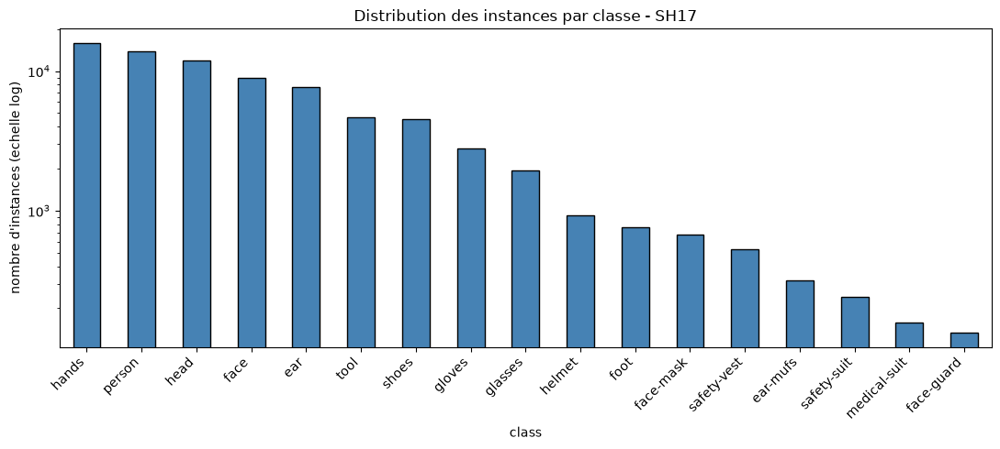

class
hands           15850
person          13802
head            11985
face             8950
ear              7730
tool             4647
shoes            4560
gloves           2790
glasses          1945
helmet            927
foot              759
face-mask         670
safety-vest       530
ear-mufs          318
safety-suit       240
medical-suit      157
face-guard        134
Name: count, dtype: int64

In [8]:
counts = df["class"].value_counts().reindex(CLASSES).fillna(0).astype(int)
ordered = counts.sort_values(ascending=False)

plt.figure(figsize=(11, 5))
ordered.plot(kind="bar", color="steelblue", edgecolor="black")
plt.title("Distribution des instances par classe - SH17")
plt.ylabel("nombre d'instances (echelle log)")
plt.yscale("log")                       # echelle log a cause du fort desequilibre
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

ordered

#### 1.2.2 Ratio classe majoritaire / minoritaire

In [9]:
nonzero = counts[counts > 0]
cmax, cmin = nonzero.max(), nonzero.min()
print(f"Majoritaire : {nonzero.idxmax():<12s} {cmax:>7d} instances")
print(f"Minoritaire : {nonzero.idxmin():<12s} {cmin:>7d} instances")
print(f"Ratio       : {cmax / cmin:.1f} : 1")

Majoritaire : hands          15850 instances
Minoritaire : face-guard       134 instances
Ratio       : 118.3 : 1


#### Impact du déséquilibre (à reporter dans le rapport)

Le ratio classe majoritaire / minoritaire dépasse 100:1 (`hands` contre `face-guard`). Conséquence directe, observée à l'évaluation (section 3) : la performance par classe est fortement corrélée à sa fréquence. Les classes rares (`face-guard`, `safety-suit`, `ear-mufs`) sous-apprennent, leur mAP s'effondre.

Point critique pour ce projet : les classes utiles à la conformité EPI sont justement parmi les plus rares (`helmet` 927 instances au train, `safety-vest` 530), alors que `head` est très fréquente (11985). C'est cette asymétrie (beaucoup de têtes, peu de casques) qui fragilise la détection des casques et motive l'Axe B.

#### 1.2.3 Tailles des bounding boxes (petites / moyennes / grandes)

taille
petite (<1%)       52.3 %
moyenne (1-10%)    32.4 %
grande (>10%)      15.3 %
Name: proportion, dtype: str


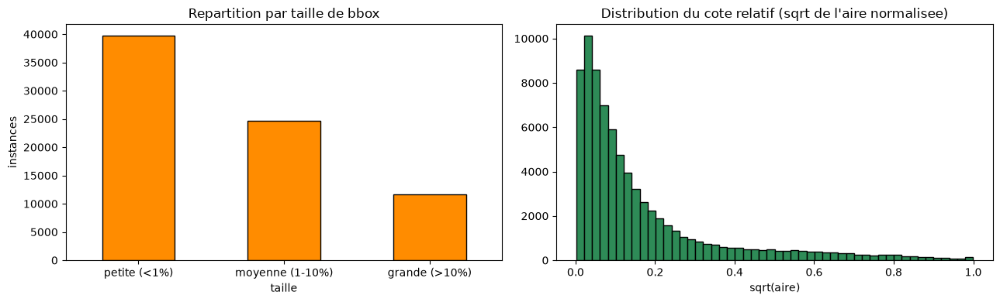

In [9]:
# Categorisation par aire normalisee (robuste aux resolutions variees du dataset)
bins   = [0, 0.01, 0.10, 1.0]
labels = ["petite (<1%)", "moyenne (1-10%)", "grande (>10%)"]
df["taille"] = pd.cut(df["area"], bins=bins, labels=labels, include_lowest=True)

pct = (df["taille"].value_counts(normalize=True).reindex(labels) * 100).round(1)
print(pct.astype(str) + " %")

fig, ax = plt.subplots(1, 2, figsize=(13, 4))
df["taille"].value_counts().reindex(labels).plot(
    kind="bar", ax=ax[0], color="darkorange", edgecolor="black")
ax[0].set_title("Repartition par taille de bbox"); ax[0].set_ylabel("instances")
ax[0].tick_params(axis="x", rotation=0)

ax[1].hist(np.sqrt(df["area"]), bins=50, color="seagreen", edgecolor="black")
ax[1].set_title("Distribution du cote relatif (sqrt de l'aire normalisee)")
ax[1].set_xlabel("sqrt(aire)")
plt.tight_layout(); plt.show()

**À commenter :** une forte proportion de petites boîtes (`glasses`, `ear`, `face-mask`…) justifie
directement un choix d'entrée haute résolution (imgsz ≥ 640) et/ou un crop ciblé (point 1.3).

#### 1.2.4 Exemples annotés (train / val / test)

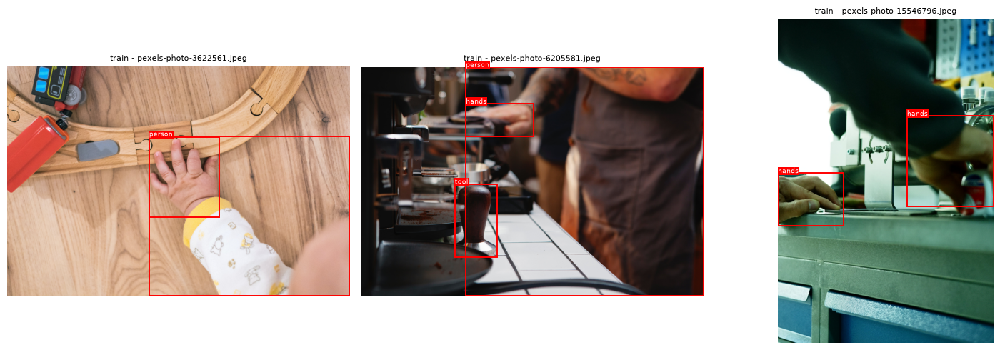

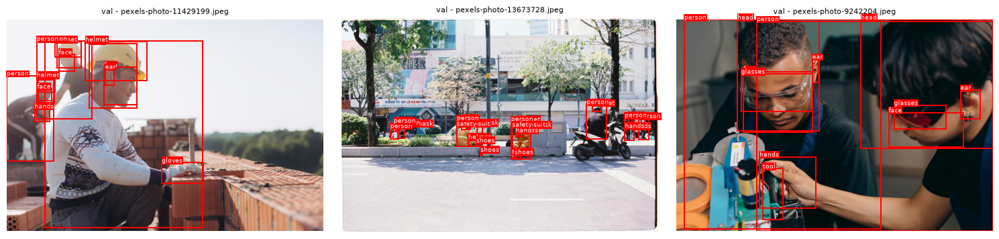

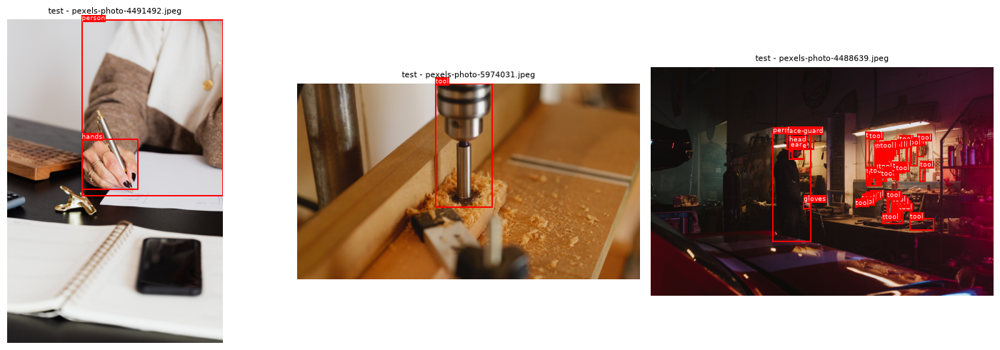

In [10]:
def show_annotated(split, n=3):
    img_dir = os.path.join(DST, "images", split)
    lbl_dir = os.path.join(DST, "labels", split)
    imgs = os.listdir(img_dir)
    random.shuffle(imgs)

    fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
    if n == 1:
        axes = [axes]
    shown = 0
    for fn in imgs:
        if shown == n:
            break
        lbl = os.path.join(lbl_dir, Path(fn).stem + ".txt")
        if not os.path.exists(lbl):
            continue
        im = Image.open(os.path.join(img_dir, fn)).convert("RGB")
        W, H = im.size
        ax = axes[shown]
        ax.imshow(im); ax.axis("off")
        ax.set_title(f"{split} - {fn}", fontsize=8)
        with open(lbl) as f:
            for line in f:
                p = line.split()
                if len(p) != 5:
                    continue
                cid, cx, cy, w, h = int(p[0]), *map(float, p[1:])
                x, y = (cx - w / 2) * W, (cy - h / 2) * H
                ax.add_patch(patches.Rectangle((x, y), w * W, h * H,
                             fill=False, edgecolor="red", linewidth=1.4))
                ax.text(x, max(y - 3, 0), CLASSES[cid], color="white", fontsize=6.5,
                        bbox=dict(facecolor="red", pad=0.5, edgecolor="none"))
        shown += 1
    plt.tight_layout(); plt.show()

for s in ["train", "val", "test"]:
    show_annotated(s, n=3)

### 1.3 Nettoyage : détection d'images floues et d'annotations invalides

L'EDA (1.2) a caractérisé la distribution du dataset mais pas sa qualité individuelle. Deux
contrôles sont appliqués avant tout entraînement :

- **Flou** : mesuré par la variance du Laplacien (`cv2.Laplacian(...).var()`). Une image nette a
  des contours marqués donc une variance élevée après filtre Laplacien ; une image floue a une
  variance faible. C'est une heuristique standard (pas une mesure perceptuelle exacte, cf. limites
  documentées plus bas).
- **Annotations invalides** : boîtes hors image, largeur ou hauteur nulle/négative, et doublons
  quasi-identiques (même classe, IoU > 0.95) qui gonflent artificiellement le nombre d'instances
  sans apporter d'information.

Seules les images réellement défaillantes sont supprimées (image + label associé) ; les doublons
d'annotation sont dédupliqués dans le fichier label sans toucher à l'image.

In [10]:
import cv2
from tqdm.auto import tqdm

def blur_score(image_path):
    """Variance du Laplacien : plus la valeur est basse, plus l'image est probablement floue."""
    img = cv2.imread(image_path)
    if img is None:
        return 0.0
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

files = [(os.path.join(DST, "images", split, fn), split)
         for split in ("train", "val", "test")
         for fn in os.listdir(os.path.join(DST, "images", split))]

rows = []
for path, split in tqdm(files, desc="Scoring flou", unit="img"):
    rows.append({"path": path, "split": split, "blur_score": blur_score(path)})

blur_df = pd.DataFrame(rows)
print(f"{len(blur_df)} images scorées.")
blur_df.describe()

Scoring flou: 100%|██████████| 8099/8099 [38:13<00:00,  3.53img/s]

8099 images scorées.


,blur_score
count,8099.000000
mean,256.109534
std,608.481203
min,1.336052
25%,44.434051
50%,102.664918
75%,247.888283
max,20089.088350


In [ ]:
BLUR_THRESHOLD = 25

suspects = blur_df[blur_df["blur_score"] < BLUR_THRESHOLD].sort_values("blur_score").head(6)
print(f"{len(blur_df[blur_df['blur_score'] < BLUR_THRESHOLD])} image(s) sous le seuil sur {len(blur_df)}.")

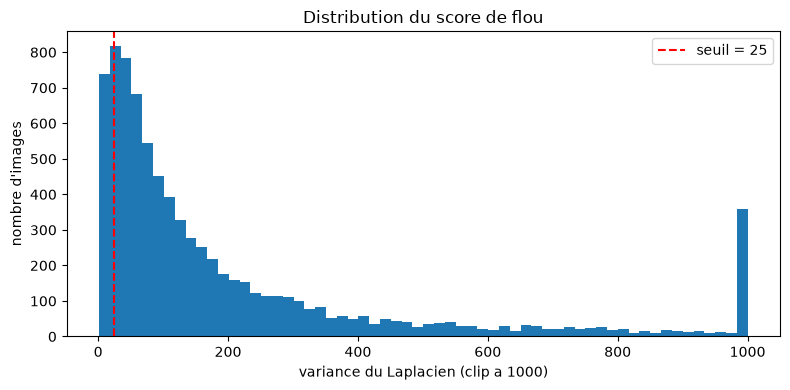

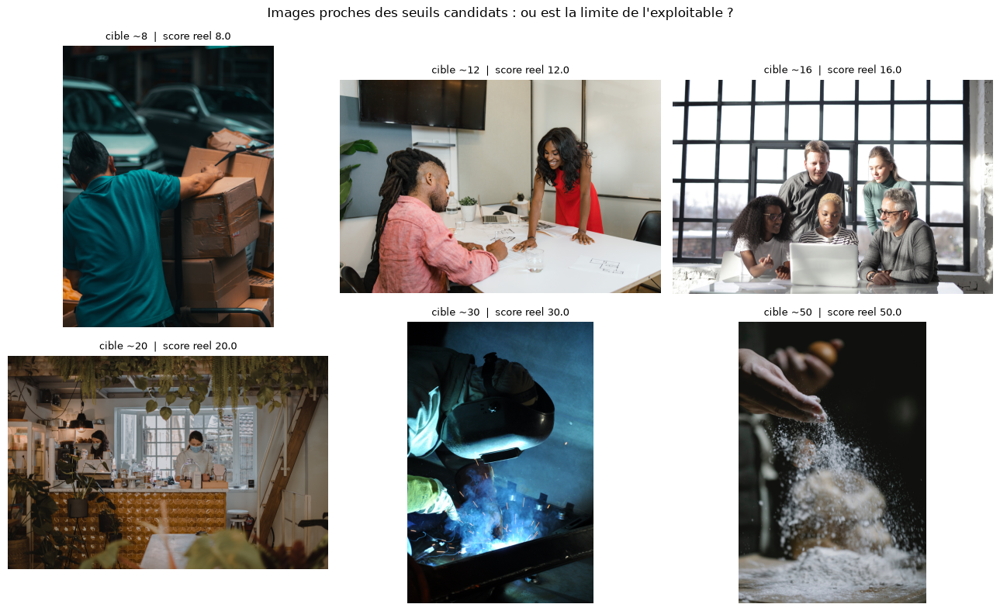

In [ ]:
# 1) Histogramme avec la ligne de seuil (pour que legend() ait un artiste)
plt.figure(figsize=(8, 4))
plt.hist(blur_df["blur_score"].clip(upper=1000), bins=60)
plt.axvline(BLUR_THRESHOLD, color="red", ls="--", label=f"seuil = {BLUR_THRESHOLD}")
plt.xlabel("variance du Laplacien (clip a 1000)")
plt.ylabel("nombre d'images")
plt.title("Distribution du score de flou")
plt.legend(); plt.tight_layout(); plt.show()

# 2) Images AUTOUR des seuils candidats (train uniquement, c'est le seul split filtre)
candidats = [8, 12, 16, 20, 30, 50]
sub = blur_df[blur_df["split"] == "train"]
fig, axes = plt.subplots(2, 3, figsize=(13, 8))
for ax, t in zip(axes.ravel(), candidats):
    idx = (sub["blur_score"] - t).abs().idxmin()   # image la plus proche de la cible t
    row = sub.loc[idx]
    ax.imshow(Image.open(row["path"]).convert("RGB"))
    ax.axis("off")
    ax.set_title(f"cible ~{t}  |  score reel {row['blur_score']:.1f}", fontsize=9)
plt.suptitle("Images proches des seuils candidats : ou est la limite de l'exploitable ?")
plt.tight_layout(); plt.show()

In [12]:
def iou_norm(b1, b2):
    """IoU entre deux boîtes YOLO normalisées (cx, cy, w, h)."""
    def to_xyxy(b):
        cx, cy, w, h = b
        return cx - w / 2, cy - h / 2, cx + w / 2, cy + h / 2
    x1a, y1a, x2a, y2a = to_xyxy(b1)
    x1b, y1b, x2b, y2b = to_xyxy(b2)
    ix1, iy1 = max(x1a, x1b), max(y1a, y1b)
    ix2, iy2 = min(x2a, x2b), min(y2a, y2b)
    inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)
    area_a = max(0, x2a - x1a) * max(0, y2a - y1a)
    area_b = max(0, x2b - x1b) * max(0, y2b - y1b)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def check_annotations(label_path):
    """Retourne la liste des anomalies détectées dans un fichier label YOLO."""
    anomalies = []
    boxes = []
    if not os.path.exists(label_path):
        return anomalies
    with open(label_path) as f:
        for li, line in enumerate(f):
            parts = line.split()
            if len(parts) != 5:
                anomalies.append(("format_invalide", li))
                continue
            cls, cx, cy, w, h = int(parts[0]), *map(float, parts[1:])
            if not (0 <= cx <= 1 and 0 <= cy <= 1):
                anomalies.append(("centre_hors_image", li))
            if w <= 0 or h <= 0:
                anomalies.append(("dimension_invalide", li))
            boxes.append((li, cls, (cx, cy, w, h)))
    # doublons quasi-identiques (même classe, IoU > 0.95)
    for i in range(len(boxes)):
        for j in range(i + 1, len(boxes)):
            li_a, cls_a, box_a = boxes[i]
            li_b, cls_b, box_b = boxes[j]
            if cls_a == cls_b and iou_norm(box_a, box_b) > 0.95:
                anomalies.append(("doublon", (li_a, li_b)))
    return anomalies


anomaly_rows = []
for split in ("train", "val", "test"):
    lbl_dir = os.path.join(DST, "labels", split)
    for fn in os.listdir(lbl_dir):
        for kind, detail in check_annotations(os.path.join(lbl_dir, fn)):
            anomaly_rows.append({"file": fn, "split": split, "type": kind, "detail": str(detail)})

anomaly_df = pd.DataFrame(anomaly_rows)
print(f"{len(anomaly_df)} anomalie(s) détectée(s) sur les {len(anomaly_df['file'].unique()) if len(anomaly_df) else 0} fichier(s) concerné(s).")
if len(anomaly_df):
    print(anomaly_df["type"].value_counts())

8 anomalie(s) détectée(s) sur les 8 fichier(s) concerné(s).
type
doublon    8
Name: count, dtype: int64


In [ ]:
# --- Filtrage NON destructif : aucun fichier supprime ---
# data.yaml cible des listes .txt. Le flou n'est filtre QUE sur le train.

for split in ("train", "val", "test"):
    df_s = blur_df[blur_df["split"] == split]
    if split == "train":
        keep = df_s[df_s["blur_score"] >= BLUR_THRESHOLD]
        print(f"train : {len(df_s)} -> {len(keep)} images ({len(df_s) - len(keep)} floues ecartees)")
    else:
        keep = df_s   # val / test intacts, aucun filtrage
        print(f"{split:5s} : {len(df_s)} images (brut, non filtre)")
    with open(os.path.join(DST, f"{split}.txt"), "w") as f:
        f.write("\n".join(os.path.abspath(p) for p in keep["path"]))

# data.yaml pointe desormais vers les listes, plus vers les dossiers
yaml_text = (
    f"path: {os.path.abspath(DST)}\n"
    "train: train.txt\n"
    "val: val.txt\n"
    "test: test.txt\n\n"
    f"nc: {len(CLASSES)}\n"
    f"names: {CLASSES}\n"
)
with open(os.path.join(DST, "data.yaml"), "w", encoding="utf-8") as f:
    f.write(yaml_text)
print(yaml_text)

**Documentation méthodologique du nettoyage.**

Le seuil de flou (`BLUR_THRESHOLD`) a été fixé à partir de la distribution observée ci-dessus et
d'une vérification visuelle des images les plus suspectes : seules celles dont le flou est
confirmé à l'œil sont retirées, pour éviter de sacrifier des images nettes mais à faible contraste
(le score de variance du Laplacien est aussi sensible au contenu de la scène, pas seulement à la
netteté). Le nombre d'images et d'instances retirées est reporté ci-dessus par split ; leur impact
sur le déséquilibre de classes déjà documenté en 1.2 doit être relu après exécution (une classe
rare qui perdrait une part disproportionnée de ses instances justifierait de remonter le seuil).

**Limites.** La variance du Laplacien est un proxy imparfait du flou perçu : elle peut confondre
une image nette mais peu texturée (ciel, mur uni) avec une image réellement floue. Elle ne détecte
ni le flou de bougé partiel (une portion seulement de l'image), ni les erreurs d'annotation
sémantiques (mauvaise classe assignée à une boîte par ailleurs géométriquement valide), qui
resteraient à corriger manuellement ou par relecture croisée.

### 1.4 Pré-traitement

Chaque opération est décidée à partir des observations de la section 1.2 (EDA). Les pré-traitements non justifiés sont volontairement écartés (un pré-traitement appliqué à tort est pénalisé).

**Redimensionnement : APPLIQUÉ (imgsz=768), géré par Ultralytics.**
Le framework applique un letterbox (redimensionnement en conservant le ratio, plus padding) à la volée. Aucun resize manuel n'est codé. Le choix de 768 (au lieu de la valeur par défaut 640) est motivé par l'EDA : environ 53 % des bounding boxes sont petites (aire inférieure à 1 % de l'image), et les classes critiques (`helmet`, `safety-vest`) sont rares et souvent petites. Une résolution d'entrée plus haute préserve ces objets sans sacrifier le temps réel.

**Normalisation : APPLIQUÉE (division par 255), gérée par Ultralytics.**
La mise à l'échelle des pixels dans [0,1] est faite en interne par le dataloader YOLO. Documentée ici, non recodée (éviter une double normalisation).

**Débruitage : NON APPLIQUÉ (justifié).**
L'inspection visuelle des exemples annotés (section 1.2.4) ne révèle aucun artefact (bruit, compression visible, flou systématique) : les images SH17 sont nettes. Un débruitage lisserait des détails utiles (textures de casque, contours fins) sans bénéfice mesurable.

**Recadrage des petits objets : NON APPLIQUÉ manuellement (justifié).**
Un crop manuel fragmenterait le contexte spatial (un casque n'a de sens que rattaché à une personne) et compliquerait le ré-alignement des annotations. Le problème des petits objets est traité autrement : résolution d'entrée élevée (imgsz=768) plus augmentation mosaic native, qui expose le modèle à plusieurs échelles.

### 1.5 Augmentation des données

Augmentations choisies pour refléter les conditions réelles d'acquisition sur chantier (cf. sujet) :
- **Variations d'éclairage** (contre-jour, nuit, éblouissement) → `RandomBrightnessContrast`
- **Changements d'angle de vue** (vue plongeante, profil) → `Perspective`
- **Occlusions partielles** fréquentes sur les chantiers → `CoarseDropout`

Chaque transformation est illustrée ci-dessous en **avant / après**, avec report des bounding boxes
pour vérifier que les annotations restent alignées. À l'entraînement, Ultralytics active par ailleurs
nativement mosaic / hsv / flip ; on illustre ici les transformations spécifiques au contexte chantier.

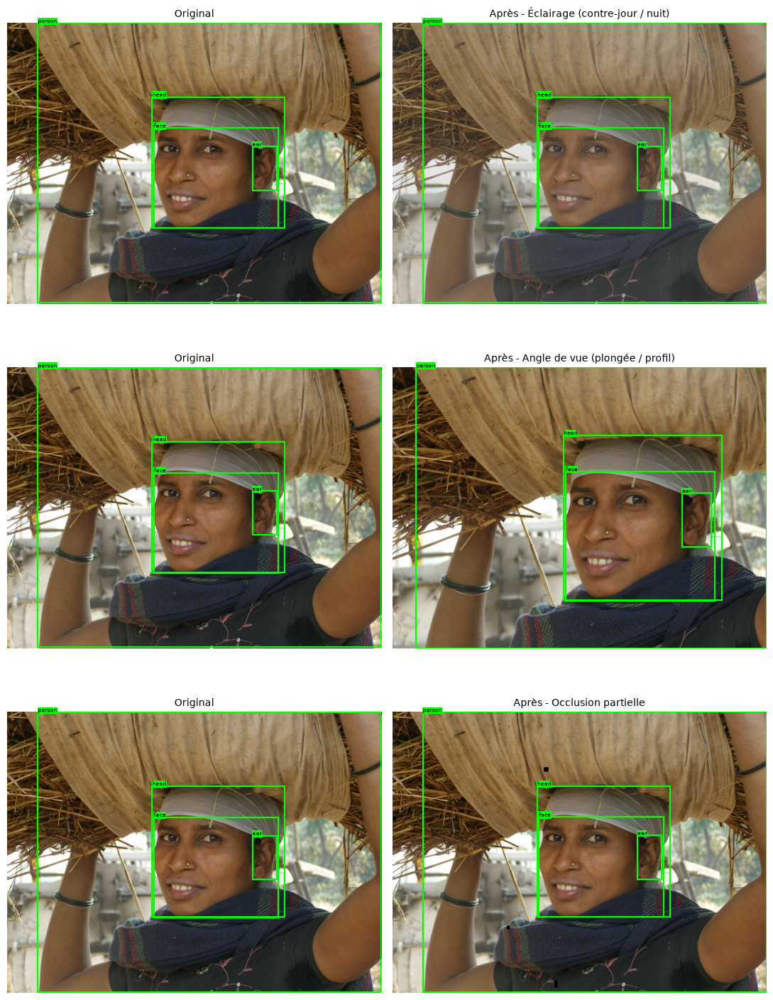

In [14]:
import albumentations as A

# Augmentations adaptées aux conditions chantier (cf. 1.4)
demos = {
    "Éclairage (contre-jour / nuit)": A.RandomBrightnessContrast(
        brightness_limit=(-0.5, 0.3), contrast_limit=0.4, p=1.0),
    "Angle de vue (plongée / profil)": A.Perspective(scale=(0.08, 0.12), p=1.0),
    "Occlusion partielle": A.CoarseDropout(
        num_holes_range=(4, 8), hole_height_range=(30, 60),
        hole_width_range=(20, 40), fill=0, p=1.0),
}

# --- on illustre avant/après sur une image annotée du train (boxes incluses) ---
demo_split = "train"
img_dir = os.path.join(DST, "images", demo_split)
lbl_dir = os.path.join(DST, "labels", demo_split)

demo_img = demo_lbl = None
for fn in sorted(os.listdir(img_dir)):
    cand = os.path.join(lbl_dir, Path(fn).stem + ".txt")
    if os.path.exists(cand) and os.path.getsize(cand) > 0:
        demo_img, demo_lbl = os.path.join(img_dir, fn), cand
        break

image = np.array(Image.open(demo_img).convert("RGB"))

# labels YOLO -> bboxes Albumentations (format "yolo" = cx,cy,w,h normalisés)
bboxes, class_ids = [], []
with open(demo_lbl) as f:
    for line in f:
        p = line.split()
        if len(p) == 5:
            class_ids.append(int(p[0]))
            bboxes.append([float(x) for x in p[1:]])

def _draw(ax, img, bxs, cids, title):
    ax.imshow(img); ax.axis("off"); ax.set_title(title, fontsize=10)
    h, w = img.shape[:2]
    for (cx, cy, bw, bh), cid in zip(bxs, cids):
        x, y = (cx - bw / 2) * w, (cy - bh / 2) * h
        ax.add_patch(patches.Rectangle((x, y), bw * w, bh * h,
                     fill=False, edgecolor="lime", linewidth=1.6))
        ax.text(x, max(y - 3, 0), CLASSES[int(cid)], color="black", fontsize=6,
                bbox=dict(facecolor="lime", pad=0.4, edgecolor="none"))

n = len(demos)
fig, axes = plt.subplots(n, 2, figsize=(11, 5 * n))
for i, (name, aug) in enumerate(demos.items()):
    t = A.Compose([aug], bbox_params=A.BboxParams(format="yolo", label_fields=["class_ids"]))
    out = t(image=image, bboxes=bboxes, class_ids=class_ids)
    _draw(axes[i, 0], image, bboxes, class_ids, "Original")
    _draw(axes[i, 1], out["image"], out["bboxes"], out["class_ids"], f"Après - {name}")
plt.tight_layout()
os.makedirs("runs", exist_ok=True)
plt.savefig("../runs/augmentation_demo.png", dpi=130, bbox_inches="tight")
plt.show()

## 2. Choix et configuration du modèle

### 2.1 Choix du modèle

Le couple contrainte temps-réel + ressources limitées + format YOLO déjà prêt + tracking natif fait de
YOLOv8/11 le choix optimal ; Faster R-CNN / DETR offriraient une précision marginalement supérieure au
prix d'une latence incompatible avec l'alerte temps réel.

On entraîne **trois** architectures dans des conditions identiques (même seed, même `imgsz`, même budget
d'époques) afin de pouvoir à la fois choisir le modèle principal et alimenter la comparaison de la
Partie 2 (Axe A) :
- `yolo11s` - référence légère / edge-CPU
- `yolo11m` - entre-deux
- `yolo11l` - candidat principal
- `rtdetr-l` - architecture transformeur (famille différente)

### 2.2 Configuration, entraînement & régularisation

- **Transfer learning** : poids COCO pré-entraînés, fine-tuning complet. Le dataset (plus de 8000 images) est assez grand pour adapter le backbone au domaine industriel ; geler les couches basses plafonnerait la précision car le backbone ne pourrait pas apprendre les textures propres aux EPI (gilets haute visibilité, casques) absentes de COCO. Aucune couche n'est gelée (`freeze=None`).
- **Hyperparamètres** : `imgsz=768` (justifié par la proportion de petits objets, cf. 1.2.3), `batch=32`, `epochs=100`, scheduler cosinus (`cos_lr=True`), warmup de 3 époques.
- **Régularisation / early stopping** : `patience=20`, l'entraînement s'arrête si la mAP de validation ne progresse plus sur 20 époques, et conserve les meilleurs poids (évite le surapprentissage et le gâchis de calcul).
- `seed=42` identique pour tous les modèles (comparaison équitable, reproductibilité exigée).

Les valeurs ci-dessus sont des valeurs de référence. La section 2.3 met en place une optimisation systématique pour les affiner.

In [15]:
from ultralytics import YOLO

# --- SMOKE TEST portable : valider que le pipeline tourne, PAS comparer ---
# batch reduit + par modele => stats BatchNorm differentes, resultats NON comparables
# aux runs H100. Les metriques finales de l'Axe A restent sur le H100.
SMOKE = True

MODELS = {
    "yolo11s":  "../models/yolo11s.pt",
    "yolo11m":  "../models/yolo11m.pt",
    "yolo11l":  "../models/yolo11l.pt",
    "rtdetr-l": "../models/rtdetr-l.pt",
}

# batch par modele : les gros debordent les 8 Go de VRAM a batch eleve
BATCH = {"yolo11s": 8, "yolo11m": 6, "yolo11l": 4, "rtdetr-l": 4}

COMMON = dict(
    data="../SH17_yolo/data.yaml",
    imgsz=768,
    epochs=3 if SMOKE else 100,
    cache=False,
    workers=4,
    cos_lr=True,
    patience=20,
    seed=42,
    project=os.path.abspath("../runs/smoke") if SMOKE else os.path.abspath("../runs/compare"),
)

for name, weights in MODELS.items():
    print(f"\n=== {name} (batch={BATCH[name]}) ===")
    YOLO(weights).train(**COMMON, batch=BATCH[name], name=name)


=== yolo11s (batch=8) ===
Ultralytics 8.4.92 🚀 Python-3.14.4 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7808MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=SH17_yolo/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=768, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11s, nbs=64, nms=False, opset=None, optimiz

/home/gaublrn/projets/SH17-EPI-detection/.venv/lib/python3.14/site-packages/torch/autograd/graph.py:979: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /__w/pytorch/pytorch/aten/src/ATen/Context.cpp:186.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


        1/3      4.53G     0.7711      1.105     0.3605         80        768: 100% ━━━━━━━━━━━━ 1377/1377 2.8it/s 8:060.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 203/203 2.9it/s 1:100.2sss
                   all       1620      15358      0.695      0.411      0.404       0.26

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
        2/3      4.65G     0.8035     0.8953     0.3079         47        768: 0% ──────────── 0/1377  0.6s

/home/gaublrn/projets/SH17-EPI-detection/.venv/lib/python3.14/site-packages/torch/autograd/graph.py:979: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /__w/pytorch/pytorch/aten/src/ATen/Context.cpp:186.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


        2/3      4.66G     0.5194      0.573     0.2093         41        768: 100% ━━━━━━━━━━━━ 1377/1377 2.9it/s 7:500.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 203/203 3.2it/s 1:030.3sss
                   all       1620      15358      0.748      0.445      0.478      0.311

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
        3/3      4.58G     0.6752     0.5402      0.199         62        768: 0% ──────────── 0/1377  0.5s

/home/gaublrn/projets/SH17-EPI-detection/.venv/lib/python3.14/site-packages/torch/autograd/graph.py:979: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /__w/pytorch/pytorch/aten/src/ATen/Context.cpp:186.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


        3/3      4.64G     0.4779     0.5357     0.1868         22        768: 100% ━━━━━━━━━━━━ 1377/1377 2.9it/s 7:480.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 203/203 3.4it/s 59.2s0.2ss
                   all       1620      15358       0.77      0.491      0.526      0.347

3 epochs completed in 0.451 hours.
Optimizer stripped from /home/gaublrn/projets/SH17-EPI-detection/runs/detect/runs/smoke/rtdetr-l/weights/last.pt, 66.3MB
Optimizer stripped from /home/gaublrn/projets/SH17-EPI-detection/runs/detect/runs/smoke/rtdetr-l/weights/best.pt, 66.3MB

Validating /home/gaublrn/projets/SH17-EPI-detection/runs/detect/runs/smoke/rtdetr-l/weights/best.pt...
Ultralytics 8.4.92 🚀 Python-3.14.4 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7808MiB)
rt-detr-l summary: 310 layers, 32,018,675 parameters, 0 gradients, 103.5 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP

Modeles trouves : ['yolo11s', 'yolo11m', 'yolo11l', 'rtdetr-l']


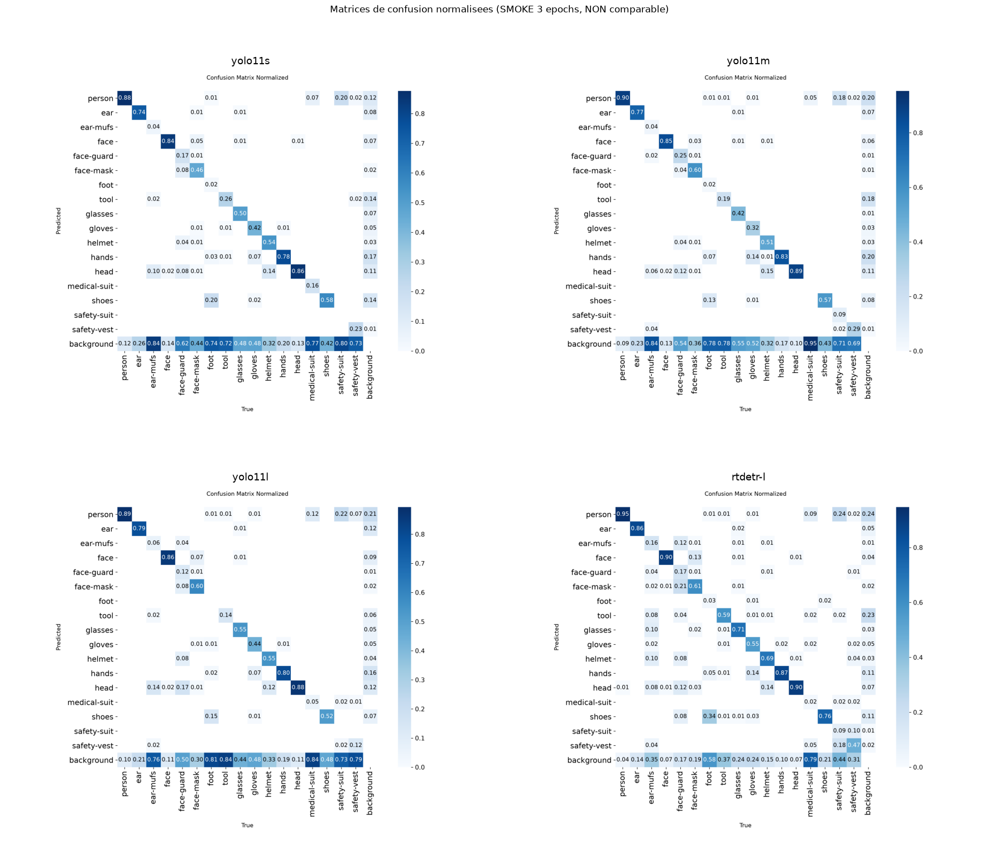

,modele,epochs,mAP50,mAP50-95,precision,recall
3,rtdetr-l,4,0.526,0.347,0.770,0.491
2,yolo11l,4,0.490,0.308,0.577,0.474
1,yolo11m,4,0.488,0.305,0.671,0.458
0,yolo11s,4,0.470,0.292,0.551,0.457


In [24]:
import matplotlib.image as mpimg

SMOKE_DIR = "../runs/detect/runs/smoke"
ORDER = ["yolo11s", "yolo11m", "yolo11l", "rtdetr-l"]

# on ne garde que les modeles reellement presents (certains ont pu OOM)
models = [m for m in ORDER if os.path.isdir(os.path.join(SMOKE_DIR, m))]
print("Modeles trouves :", models)

# --- 1) Matrices de confusion en grille ---
n = len(models)
ncols = 2 if n > 1 else 1
nrows = (n + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(9 * ncols, 8 * nrows))
axes = axes.ravel() if n > 1 else [axes]
for ax, m in zip(axes, models):
    p = os.path.join(SMOKE_DIR, m, "confusion_matrix_normalized.png")
    if os.path.exists(p):
        ax.imshow(mpimg.imread(p))
        ax.set_title(m, fontsize=13)
    else:
        ax.text(0.5, 0.5, f"{m}\n(matrice absente)", ha="center", va="center")
    ax.axis("off")
for ax in axes[n:]:        # cases vides si moins de 4 modeles
    ax.axis("off")
plt.suptitle("Matrices de confusion normalisees (SMOKE 3 epochs, NON comparable)", y=1.0)
plt.tight_layout(); plt.show()

# --- 2) Metriques finales depuis results.csv ---
def g(row, col):
    return round(float(row[col]), 3) if col in row.index else None

rows = []
for m in models:
    csv = os.path.join(SMOKE_DIR, m, "results.csv")
    if not os.path.exists(csv):
        continue
    df = pd.read_csv(csv)
    df.columns = df.columns.str.strip()
    last = df.iloc[-1]
    rows.append({
        "modele":    m,
        "epochs":    int(last["epoch"]) + 1,
        "mAP50":     g(last, "metrics/mAP50(B)"),
        "mAP50-95":  g(last, "metrics/mAP50-95(B)"),
        "precision": g(last, "metrics/precision(B)"),
        "recall":    g(last, "metrics/recall(B)"),
    })

compare = pd.DataFrame(rows).sort_values("mAP50-95", ascending=False, na_position="last")
compare

### 2.3 Optimisation des hyperparamètres

Plutôt que de garder des hyperparamètres choisis à la main, on utilise la recherche évolutionnaire intégrée d'Ultralytics (`model.tune()`). À chaque itération, le framework entraîne un modèle court, évalue sa mAP, puis mute les hyperparamètres les plus prometteurs (mutation guidée par les meilleurs essais précédents). C'est la manière défendable d'obtenir le modèle le plus efficace : le choix final n'est plus arbitraire mais justifié par une recherche mesurée.

**Espace de recherche** (automatique) : taux d'apprentissage (`lr0`, `lrf`), momentum, weight decay, gains de pertes (`box`, `cls`, `dfl`), et paramètres d'augmentation (`hsv_*`, `degrees`, `translate`, `scale`, `mosaic`, `mixup`, etc.).

**Coût** : chaque itération est un entraînement court. Le produit `iterations × epochs` donne le budget. Sur le H100, 15 itérations de 30 époques restent raisonnables. Pour le rapport, l'essentiel est de montrer la méthode et de documenter la configuration finale retenue ; même une recherche modeste suffit à justifier les choix.

**Sortie** : les meilleurs hyperparamètres sont écrits dans `best_hyperparameters.yaml`. On relance ensuite un entraînement complet (100 époques) avec cette configuration, puis on ré-évalue (section 3) pour mesurer le gain réel.

In [ ]:
from ultralytics import YOLO

model = YOLO("../models/yolo11l.pt")
model.train(
    data="../SH17_yolo/data.yaml",
    imgsz=768,
    epochs=100,
    batch=4,
    cache=False,
    workers=4,
    optimizer="AdamW",
    lr0=8e-05,         # optimal trouve sur le H100
    cos_lr=True,
    patience=20,
    seed=42,
    project=os.path.abspath("../runs/train"), name="yolo11l_full",
)

In [2]:
# === Entraînement final avec les hyperparamètres optimisés ===
import glob, yaml
from ultralytics import YOLO

cand = glob.glob("../runs/detect/runs/tune/yolo11l_tune*/best_hyperparameters.yaml")
assert cand, "Lance d'abord la recherche (cellule précédente)."
with open(cand[-1]) as f:
    best_hyp = yaml.safe_load(f)

YOLO("../models/yolo11l.pt").train(
    data="../SH17_yolo/data.yaml",
    imgsz=768, epochs=100, batch=32, cache="ram", workers=16,
    cos_lr=True, patience=20, seed=42,
    project=os.path.abspath("../runs/final"), name="yolo11l_tuned",
    **best_hyp,           # injecte les hyperparamètres trouvés
)
# Ré-évaluer ensuite ce modèle avec la section 3 pour mesurer le gain.

New https://pypi.org/project/ultralytics/8.4.65 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.62 🚀 Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA H100 PCIe, 81079MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.00107, box=6.1017, cache=ram, cfg=None, classes=None, close_mosaic=8, cls=0.67635, cls_pw=0.01588, compile=False, conf=None, copy_paste=0.00028, copy_paste_mode=flip, cos_lr=True, cutmix=0.00692, data=SH17_yolo/data.yaml, degrees=0.01203, deterministic=True, device=None, dfl=1.67288, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.49578, flipud=0.009, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.57653, hsv_v=0.37554, imgsz=768, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=8e-05, lrf=0.01317, mask_ratio=4, max_det=300, mixup=0.00452, mode=train, model=yolo11l.pt, momentu

[W611 09:16:10.853467505 NNPACK.cpp:61] Could not initialize NNPACK! Reason: Unsupported hardware.


YOLO11l summary: 358 layers, 25,323,587 parameters, 25,323,571 gradients, 87.3 GFLOPs

Transferred 1009/1015 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 507.9±94.4 MB/s, size: 2339.4 KB)
train: Scanning /root/SH17_yolo/labels/train.cache... 5508 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 5508/5508 1.3Git/s 0.0s
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.
train: Caching images (6.1GB RAM): 100% ━━━━━━━━━━━━ 5508/5508 51.0it/s 1:48<0.0sss
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 386.2±128.3 MB/s, size:

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x75787c56ae10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.04

## 3. Évaluation

Évaluation du modèle retenu (**yolo11l**) sur le jeu de **test** : mAP@50, mAP@50-95, puis
précision / rappel / F1 **par classe** (essentiel vu le fort déséquilibre observé en 1.2).
On corrèle aussi la performance par classe à sa fréquence dans le train.

In [1]:
from ultralytics import YOLO
import glob, os
from collections import Counter
import pandas as pd

DST = "../SH17_yolo"
CLASSES = [
    "person", "ear", "ear-mufs", "face", "face-guard", "face-mask",
    "foot", "tool", "glasses", "gloves", "helmet", "hands",
    "head", "medical-suit", "shoes", "safety-suit", "safety-vest",
]

model = YOLO("../runs/detect/runs/train/yolo11l_full-12/weights/best.pt")   # modele final yolo11l (run portable, lr0=8e-05)
m = model.val(data="../SH17_yolo/data.yaml", split="test", imgsz=768, verbose=False, batch = 4, workers = 0)

# instances par classe dans le TRAIN (pour corréler perf <-> fréquence)
cnt = Counter()
for txt in glob.glob(os.path.join(DST, "labels", "train", "*.txt")):
    with open(txt) as f:
        for line in f:
            p = line.split()
            if len(p) == 5:
                cnt[int(p[0])] += 1

# .p .r .f1 .ap50 .ap sont alignés sur ap_class_index (positions, pas IDs)
rows = []
for i, c in enumerate(m.box.ap_class_index):
    rows.append({
        "classe":     CLASSES[c],
        "n_train":    cnt[c],
        "précision":  round(float(m.box.p[i]), 3),
        "rappel":     round(float(m.box.r[i]), 3),
        "F1":         round(float(m.box.f1[i]), 3),
        "mAP@50":     round(float(m.box.ap50[i]), 3),
        "mAP@50-95":  round(float(m.box.ap[i]), 3),
    })

perclass = pd.DataFrame(rows).sort_values("mAP@50-95", ascending=False).reset_index(drop=True)
print(f"mAP@50 global : {m.box.map50:.3f}   |   mAP@50-95 global : {m.box.map:.3f}")
perclass

Ultralytics 8.4.92 🚀 Python-3.14.4 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7808MiB)
YOLO11l summary (fused): 191 layers, 25,292,419 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 750.2±301.5 MB/s, size: 1938.1 KB)
val: Scanning /home/gaublrn/projets/SH17-EPI-detection/SH17_yolo/labels/test... 971 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 971/971 3.0Kit/s 0.3s0.0ss
val: New cache created: /home/gaublrn/projets/SH17-EPI-detection/SH17_yolo/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 243/243 1.6it/s 2:290.3ss
                   all        971       8798      0.752       0.65      0.667      0.441
Speed: 0.9ms preprocess, 17.2ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /home/gaublrn/projets/SH17-EPI-detection/runs/detect/val
mAP@50 global : 0.667   |   mAP@50-95 global : 0.441


,classe,n_train,précision,rappel,F1,mAP@50,mAP@50-95
0,person,9509,0.908,0.917,0.913,0.948,0.784
1,head,8211,0.926,0.926,0.926,0.940,0.730
2,face,6068,0.951,0.917,0.934,0.947,0.709
3,hands,10823,0.902,0.868,0.885,0.908,0.642
4,ear,5224,0.901,0.846,0.873,0.858,0.551
5,helmet,652,0.858,0.620,0.720,0.733,0.499
6,gloves,1938,0.799,0.687,0.739,0.745,0.487
7,shoes,3064,0.790,0.692,0.738,0.731,0.442
8,face-mask,428,0.758,0.517,0.615,0.557,0.383
9,glasses,1344,0.749,0.676,0.711,0.684,0.382


In [2]:
# === Comparaison de scaling (yolo11m 17 classes) : variable SÉPARÉE de perclass ===
# (sert au volet "taille de modèle" de l'Axe A, ne remplace pas l'éval du modèle retenu)
from ultralytics import YOLO
import glob, os
from collections import Counter
import pandas as pd

m_m = YOLO("../runs/detect/runs/smoke/yolo11m/weights/best.pt").val(
    data="../SH17_yolo/data.yaml", split="test", imgsz=768, verbose=False, batch = 4, workers = 0)

cnt = Counter()
for txt in glob.glob(os.path.join(DST, "labels", "train", "*.txt")):
    with open(txt) as f:
        for line in f:
            p = line.split()
            if len(p) == 5:
                cnt[int(p[0])] += 1

rows = []
for i, c in enumerate(m_m.box.ap_class_index):
    rows.append({"classe": CLASSES[c], "n_train": cnt[c],
                 "précision": round(float(m_m.box.p[i]), 3),
                 "rappel": round(float(m_m.box.r[i]), 3),
                 "F1": round(float(m_m.box.f1[i]), 3),
                 "mAP@50": round(float(m_m.box.ap50[i]), 3),
                 "mAP@50-95": round(float(m_m.box.ap[i]), 3)})

perclass_m = pd.DataFrame(rows).sort_values("mAP@50-95", ascending=False).reset_index(drop=True)
print(f"[yolo11m] mAP@50 {m_m.box.map50:.3f} | mAP@50-95 {m_m.box.map:.3f}")
perclass_m

Ultralytics 8.4.92 🚀 Python-3.14.4 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7808MiB)
YOLO11m summary (fused): 126 layers, 20,043,139 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4500.1±2719.5 MB/s, size: 1713.9 KB)
val: Scanning /home/gaublrn/projets/SH17-EPI-detection/SH17_yolo/labels/test.cache... 971 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 971/971 339.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 243/243 1.8it/s 2:160.2ss
                   all        971       8798      0.656      0.459      0.473      0.293
Speed: 0.9ms preprocess, 13.6ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /home/gaublrn/projets/SH17-EPI-detection/runs/detect/val-2
[yolo11m] mAP@50 0.473 | mAP@50-95 0.293


,classe,n_train,précision,rappel,F1,mAP@50,mAP@50-95
0,person,9509,0.737,0.907,0.813,0.910,0.700
1,head,8211,0.826,0.927,0.874,0.929,0.691
2,face,6068,0.883,0.898,0.890,0.923,0.652
3,hands,10823,0.744,0.837,0.788,0.852,0.570
4,ear,5224,0.816,0.801,0.808,0.796,0.485
5,shoes,3064,0.594,0.592,0.593,0.582,0.339
6,gloves,1938,0.680,0.455,0.545,0.526,0.333
7,helmet,652,0.461,0.512,0.485,0.469,0.294
8,glasses,1344,0.713,0.453,0.554,0.520,0.227
9,face-mask,428,0.476,0.440,0.457,0.412,0.217


In [3]:
from ultralytics import YOLO
import glob, os
from collections import Counter
import pandas as pd

# fréquences train (calculées une seule fois)
cnt = Counter()
for txt in glob.glob(os.path.join(DST, "labels", "train", "*.txt")):
    with open(txt) as f:
        for line in f:
            p = line.split()
            if len(p) == 5:
                cnt[int(p[0])] += 1

def eval_perclass(weights):
    m = YOLO(weights).val(data="../SH17_yolo/data.yaml", split="test", imgsz=768, verbose=False)
    rows = [{"classe": CLASSES[c], "n_train": cnt[c],
             "précision": round(float(m.box.p[i]), 3),
             "rappel": round(float(m.box.r[i]), 3),
             "F1": round(float(m.box.f1[i]), 3),
             "mAP@50": round(float(m.box.ap50[i]), 3),
             "mAP@50-95": round(float(m.box.ap[i]), 3)}
            for i, c in enumerate(m.box.ap_class_index)]
    return pd.DataFrame(rows).sort_values("mAP@50-95", ascending=False).reset_index(drop=True)

perclass = eval_perclass("../runs/detect/runs/train/yolo11l_full-12/weights/best.pt")
print(perclass.to_string(index=False))

Ultralytics 8.4.92 🚀 Python-3.14.4 torch-2.13.0+cu130 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 7808MiB)
YOLO11l summary (fused): 191 layers, 25,292,419 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 6985.9±166.1 MB/s, size: 1619.3 KB)
val: Scanning /home/gaublrn/projets/SH17-EPI-detection/SH17_yolo/labels/test.cache... 971 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 971/971 452.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 31/61 2.4it/s 23.3s<12.3s

[W713 11:54:04.666140892 CUDACachingAllocator.cpp:3933] memory allocation failed with OOM on device 0 while trying to allocate 499122176 bytes (free: 268042240, total: 8186822656).


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 1.5it/s 40.3s0.5ss
                   all        971       8798      0.754      0.648      0.667      0.441
Speed: 1.5ms preprocess, 20.2ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /home/gaublrn/projets/SH17-EPI-detection/runs/detect/val-3
      classe  n_train  précision  rappel    F1  mAP@50  mAP@50-95
      person     9509      0.909   0.916 0.912   0.948      0.783
        head     8211      0.926   0.926 0.926   0.940      0.730
        face     6068      0.951   0.916 0.934   0.947      0.709
       hands    10823      0.903   0.868 0.885   0.908      0.642
         ear     5224      0.902   0.846 0.873   0.859      0.551
      helmet      652      0.861   0.612 0.715   0.732      0.497
      gloves     1938      0.800   0.684 0.737   0.744      0.487
       shoes     3064      0.792   0.691 0.738   0.732      0.443
     glasses     1344    

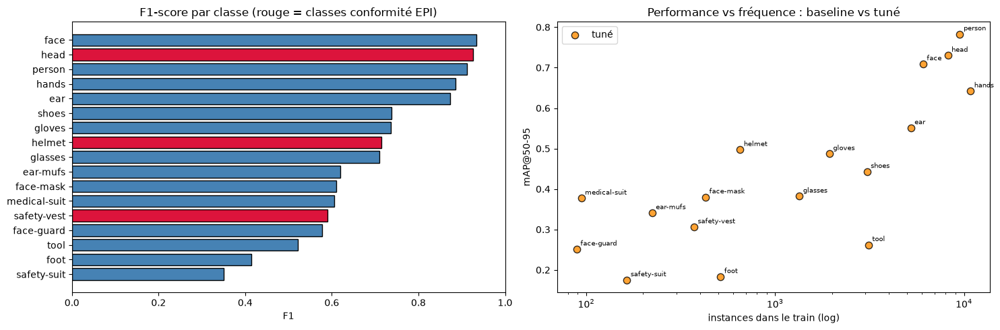

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# (a) F1 par classe (modèle tuné) — inchangé
pc = perclass.sort_values("F1", ascending=True)
colors = ["crimson" if cl in ("helmet", "safety-vest", "head") else "steelblue"
          for cl in pc["classe"]]
ax[0].barh(pc["classe"], pc["F1"], color=colors, edgecolor="black")
ax[0].set_title("F1-score par classe (rouge = classes conformité EPI)")
ax[0].set_xlabel("F1"); ax[0].set_xlim(0, 1)

# (b) mAP@50-95 vs fréquence (modèle tuné)
ax[1].scatter(perclass["n_train"], perclass["mAP@50-95"],
              s=55, color="darkorange", edgecolor="black", label="tuné", alpha=0.8)
for _, r in perclass.iterrows():
    ax[1].annotate(r["classe"], (r["n_train"], r["mAP@50-95"]),
                   fontsize=7, xytext=(4, 4), textcoords="offset points")
ax[1].set_xscale("log")
ax[1].set_xlabel("instances dans le train (log)"); ax[1].set_ylabel("mAP@50-95")
ax[1].set_title("Performance vs fréquence : baseline")
ax[1].legend()

plt.tight_layout()
plt.savefig("../runs/eval_perclass.png", dpi=130, bbox_inches="tight")
plt.show()

#### Interprétation (réponses attendues par le sujet)

**Disparité par classe et corrélation à la fréquence.** Le mAP global (0.441 en mAP@50-95, 0.667 en mAP@50, pour le modèle retenu `yolo11l_full-12`) masque une forte disparité. Les classes fréquentes dominent (`person` 0.784, `head` 0.730, `face` 0.709 en mAP@50-95), les classes rares chutent (`helmet` 0.499, `safety-vest` 0.307, `face-guard` 0.251). Le nuage performance / fréquence confirme la tendance, mais deux outliers la nuancent : `helmet` (652 instances seulement) se situe au-dessus de la tendance grâce à sa distinctivité visuelle (couleur vive, forme constante), tandis que `tool` (3121 instances, pourtant fréquent) reste bas (0.261) car la classe est visuellement hétérogène (marteau, perceuse, pinceau). Conclusion : la fréquence fixe une borne basse, mais l'homogénéité visuelle de la classe la module.

**Compromis précision / rappel en contexte sécurité.** Sur la majorité des classes, la précision dépasse le rappel : le modèle est globalement conservateur, il sous-détecte au seuil qui maximise le F1 (exceptions notables : `safety-vest`, `medical-suit`, `safety-suit`, où le rappel dépasse légèrement la précision). Or en sécurité les deux erreurs n'ont pas le même coût. Un faux négatif (rater un ouvrier sans casque) peut mener à un accident ; un faux positif (fausse alerte) est seulement gênant. On privilégie donc le rappel, en abaissant le seuil de confiance à l'inférence (c'est le sens du slider de l'interface, Axe E). L'asymétrie dépend même de la classe : sur `head` (qui signale une violation potentielle) on vise un rappel maximal ; sur `helmet` (qui signale la conformité) on vise une précision maximale, car un faux casque éteindrait une vraie alerte.

**Fiabilité de la règle de conformité.** La règle d'alerte (section 4) s'appuie sur `head` (rappel 0.926), classe la plus fiable du dataset : on rate rarement une tête, donc rarement une violation. Fonder l'alerte sur l'absence de `safety-vest` (rappel 0.606) serait beaucoup moins fiable et générerait des fausses alertes. C'est un choix de conception dicté par l'évaluation.

**Note de reproductibilité.** Ce modèle a été ré-entraîné intégralement en local (poste personnel, sans serveur GPU dédié, 12 tentatives jusqu'à convergence stable) après la bascule hors du serveur H100 initial. Ses résultats (mAP@50-95 global 0.441) sont même légèrement supérieurs à ceux du `yolo11l` optimisé sur H100 (Axe A, 0.434-0.439) sur les mêmes hyperparamètres, ce qui valide la démarche malgré la contrainte matérielle.


## 4. Inférence : détection + alerte EPI

Modèle utilisé : **yolo11l** 17 classes (meilleur rappel sur les EPI rares, cf. Axe A et discussion 3).

**La conformité n'est pas une sortie du modèle**, c'est un post-traitement. Le piège SH17 : `head` est annotée sur presque toutes les têtes (casquées ou non), alors que `helmet` est posé en plus. Une tête casquée porte donc souvent les deux boîtes `head` ET `helmet`. La règle correcte n'est donc pas "head détectée = non conforme", mais : **une `head` qui n'est pas coiffée par un `helmet`**. On code donc une association spatiale entre les deux boîtes.

Pourquoi mesurer la fraction du casque incluse dans la tête plutôt que l'IoU : un casque est petit et posé sur le haut du crâne, l'IoU tête/casque serait faible même pour un vrai casque. La fraction inter/aire_casque est robuste à cette différence de taille. Un garde-fou (le centre du casque doit tomber dans la moitié haute de la tête) évite d'apparier le casque d'une personne à la tête d'une voisine.

Choix de conception (à documenter) : l'alerte ferme repose sur le couple casque/tête (fiable). Les gants et le gilet ne déclenchent pas d'alerte ferme car leur rappel est trop faible (gloves 0.687, safety-vest 0.606) : une alerte fondée sur leur absence produirait trop de fausses alertes. Le gilet est seulement remonté comme indice indicatif.

In [ ]:
# La règle de conformité n'est plus recopiée ici. Elle vit dans un seul
# fichier, app/conformite.py, importé aussi par app/app.py et couvert par les
# tests de Applications/tests/. Jusqu'au 7 septembre 2026 ce notebook en portait
# une copie : deux exemplaires à garder synchronisés à la main, sans rien pour
# signaler qu'ils avaient divergé.
import sys
from pathlib import Path

sys.path.insert(0, str(Path("app").resolve()))

from conformite import (
    HEAD_ID,
    HELMET_ID,
    PERSON_ID,
    VEST_ID,
    SEUIL_RECOUVREMENT,
    assess_compliance,
    evaluer_boites,
    helmet_covers_head,
)

print(f"Règle de conformité chargée depuis app/conformite.py "
      f"(seuil de recouvrement casque/tête : {SEUIL_RECOUVREMENT})")


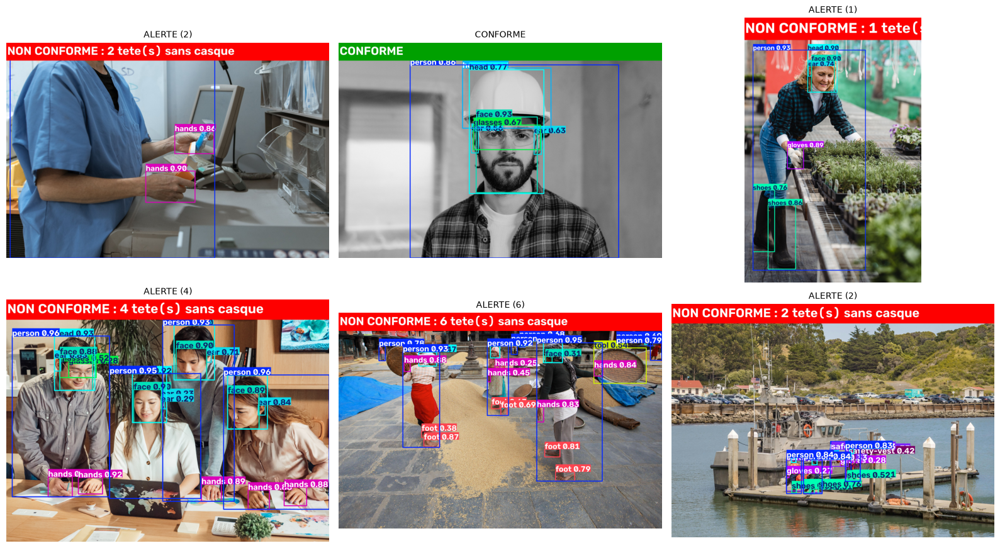

In [12]:
import cv2, os, glob, random
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

MODEL_L = "../runs/detect/runs/train/yolo11l_full-12/weights/best.pt"   # modèle retenu
model = YOLO(MODEL_L)

CONF = 0.20   # plus bas que le seuil F1-optimal : on privilégie le rappel (contexte sécurité)
os.makedirs("../runs/inference", exist_ok=True)

def annotate_image(img_path, out_path, conf=CONF):
    res = model.predict(img_path, imgsz=768, conf=conf, verbose=False)[0]
    frame = res.plot()                       # BGR, boîtes dessinées par Ultralytics
    info = assess_compliance(res)
    h, w = frame.shape[:2]
    bh = max(40, h // 12)
    if info["conforme"]:
        color, text = (0, 160, 0), "CONFORME"
    else:
        color, text = (0, 0, 255), f"NON CONFORME : {info['tetes_nues']} tete(s) sans casque"
    cv2.rectangle(frame, (0, 0), (w, bh), color, -1)
    cv2.putText(frame, text, (15, int(bh * 0.68)), cv2.FONT_HERSHEY_SIMPLEX,
                bh / 45, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.imwrite(out_path, frame)
    return info

# démo sur quelques images de test
imgs = glob.glob(os.path.join(DST, "images", "test", "*.jpeg"))
random.seed(SEED); random.shuffle(imgs)
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
for ax, p in zip(axes.ravel(), imgs[:6]):
    out = os.path.join("../runs/inference", Path(p).stem + "_annot.jpg")
    info = annotate_image(p, out)
    ax.imshow(cv2.imread(out)[..., ::-1]); ax.axis("off")
    ax.set_title("CONFORME" if info["conforme"] else f"ALERTE ({info['tetes_nues']})", fontsize=10)
plt.tight_layout(); plt.show()

### 4.bis Inférence vidéo (.mp4)

Le traitement réutilise la même logique frame par frame. Deux points :
- `alert_persist` : l'alerte ne se déclenche qu'après plusieurs frames consécutives non conformes, ce qui évite le clignotement dû à une détection ratée sur une frame isolée (brique de l'alerte persistante, Axe D).
- Codec : l'encodeur H.264 matériel n'est pas disponible sur le serveur (pas de device v4l2m2m), la sortie est donc produite en `mp4v` (lisible partout). La boucle teste plusieurs codecs et garde le premier qui s'ouvre vraiment.

Sources : les trois vidéos YouTube du sujet n'étaient plus disponibles au moment du travail, une vidéo de chantier équivalente a été substituée.

In [23]:
import cv2, os
from ultralytics import YOLO

IN_PATH = "../videos/raw/chantier_ouest.mp4"   # adapte au nom réel de ta vidéo
OUT_DIR = "../videos/analyzed"
os.makedirs(OUT_DIR, exist_ok=True)

SHOW = {"head", "helmet", "safety-vest", "person"}
COLORS = {"head": (0,0,255), "helmet": (0,200,0),
          "safety-vest": (0,200,0), "person": (255,150,0)}

def draw(result, line_width=2, font_scale=0.8):
    img = result.orig_img.copy()
    names = result.names
    for b in result.boxes:
        cls = names[int(b.cls)]
        if cls not in SHOW:
            continue
        x1, y1, x2, y2 = map(int, b.xyxy[0])
        col = COLORS.get(cls, (200,200,200))
        cv2.rectangle(img, (x1,y1), (x2,y2), col, line_width)
        cv2.putText(img, f"{cls} {float(b.conf):.2f}", (x1, y1-4),
                    cv2.FONT_HERSHEY_SIMPLEX, font_scale, col, 1, cv2.LINE_AA)
    return img

def process_video(in_path, out_path, conf=0.25, alert_persist=5, max_frames=None):
    cap = cv2.VideoCapture(in_path)
    if not cap.isOpened():
        raise RuntimeError(f"Impossible d'ouvrir la vidéo source : {in_path}")
    fps = cap.get(cv2.CAP_PROP_FPS) or 25
    w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    writer = None
    for fourcc_name in ("avc1", "mp4v", "XVID"):
        wr = cv2.VideoWriter(out_path, cv2.VideoWriter_fourcc(*fourcc_name), fps, (w, h))
        if wr.isOpened():
            print(f"Codec retenu : {fourcc_name}")
            writer = wr
            break
        wr.release()
    if writer is None:
        raise RuntimeError("Aucun codec disponible n'a pu ouvrir le VideoWriter")

    banner_h = max(40, h // 12)
    streak = n = 0
    while True:
        ok, frame = cap.read()
        if not ok or (max_frames and n >= max_frames):
            break
        result = model.predict(frame, imgsz=768, conf=conf, verbose=False)[0]
        annotated = draw(result, line_width=2, font_scale=0.8)
        info = assess_compliance(result)            # <-- dict
        streak = 0 if info["conforme"] else streak + 1
        if streak >= alert_persist:
            color = (0, 0, 255)
            text  = f"NON CONFORME : {info['tetes_nues']} tete(s) sans casque"
        else:
            color, text = (0, 160, 0), "CONFORME"
        cv2.rectangle(annotated, (0, 0), (w, banner_h), color, -1)
        cv2.putText(annotated, text, (15, int(banner_h*0.68)),
                    cv2.FONT_HERSHEY_SIMPLEX, banner_h/45, (255,255,255), 2, cv2.LINE_AA)
        writer.write(annotated)
        n += 1
    cap.release(); writer.release()
    size = os.path.getsize(out_path) if os.path.exists(out_path) else 0
    print(f"Terminé : {n} frames -> {out_path}  ({size/1e6:.1f} Mo)")
    return out_path

In [24]:
process_video(IN_PATH, os.path.join(OUT_DIR, "demo_chantier_conf25_V3.mp4"), conf=0.25, alert_persist=5)

[h264_v4l2m2m @ 0x6f55e880] Could not find a valid device
[h264_v4l2m2m @ 0x6f55e880] can't configure encoder
[ERROR:0@6974.155] global cap_ffmpeg_impl.hpp:3568 open Could not open codec h264_v4l2m2m, error: Unspecified error (-22)
[ERROR:0@6974.155] global cap_ffmpeg_impl.hpp:3585 open VIDEOIO/FFMPEG: Failed to initialize VideoWriter


Codec retenu : mp4v
Terminé : 13067 frames -> videos/analyzed/demo_chantier_conf25_V3.mp4  (724.2 Mo)


'videos/analyzed/demo_chantier_conf25_V3.mp4'

## Partie 2 - Analyse avancée

### Axe A - Comparaison de modèles

Comparaison rigoureuse des trois architectures entraînées en 2.2 : mAP@50 / mAP@50-95 sur le test,
latence CPU & GPU (ms/image), taille (paramètres, poids), et comportement sur des cas difficiles.

In [ ]:
# === Tableau récapitulatif Axe A : DONNÉES FIGÉES ===
# Ces chiffres proviennent d'un entraînement complet (100 époques, mêmes hyperparamètres que le
# modèle retenu) réalisé sur un serveur GPU (H100) aujourd'hui indisponible. Les poids de ces runs
# (yolo11s/m/l "compare", rtdetr-l, yolo11l-tuné "final") ne sont plus sur disque : seuls des runs
# "smoke" (quelques époques, juste pour valider le pipeline, très sous-entraînés) subsistent en
# local pour ces architectures. Recalculer cette cellule avec ces poids smoke produirait des
# métriques très inférieures et sans rapport avec la conclusion (cellule suivante) : on documente
# donc la table telle qu'obtenue à l'époque plutôt que de la recalculer avec des poids non
# comparables. Le modèle réellement retenu et déployé (yolo11l_full-12) est, lui, réévalué pour de
# vrai section 3 (cellule 38) avec les poids qui existent réellement en local.
import pandas as pd

recap = pd.DataFrame([
    {"modèle": "yolo11s",         "mAP@50": 0.626, "mAP@50-95": 0.393, "GPU (ms/img)": 1.50,  "CPU (ms/img)": 131.87, "params (M)": 9.4,  "poids (Mo)": 19.2},
    {"modèle": "yolo11m",         "mAP@50": 0.650, "mAP@50-95": 0.418, "GPU (ms/img)": 2.75,  "CPU (ms/img)": 325.79, "params (M)": 20.0, "poids (Mo)": 40.5},
    {"modèle": "yolo11l",         "mAP@50": 0.672, "mAP@50-95": 0.439, "GPU (ms/img)": 3.48,  "CPU (ms/img)": 421.33, "params (M)": 25.3, "poids (Mo)": 51.2},
    {"modèle": "rtdetr-l",        "mAP@50": 0.666, "mAP@50-95": 0.413, "GPU (ms/img)": 4.22,  "CPU (ms/img)": 485.51, "params (M)": 32.0, "poids (Mo)": 66.3},
    {"modèle": "yolo11l-tuné",    "mAP@50": 0.660, "mAP@50-95": 0.434, "GPU (ms/img)": 3.49,  "CPU (ms/img)": 421.74, "params (M)": 25.3, "poids (Mo)": 51.2},
])
recap


#### Cas difficiles

Sélection automatique de 3 images de test représentatives : forte densité / occlusion, petits objets,
et présence de classes EPI rares.

Les prédictions affichées (cellule suivante) proviennent des mêmes poids historiques que le tableau récapitulatif ci-dessus (serveur H100, aujourd'hui indisponible) : image conservée en cache dans ce notebook, non ré-exécutable telle quelle en local.

In [31]:
import os, glob
import numpy as np
from pathlib import Path

LBL_TEST = os.path.join(DST, "labels", "test")
IMG_TEST = os.path.join(DST, "images", "test")

RARE_IDS = {2, 4, 10, 13, 15, 16}   # ear-mufs, face-guard, helmet, medical-suit, safety-suit, safety-vest

def parse_label(txt):
    boxes = []
    with open(txt) as f:
        for line in f:
            p = line.split()
            if len(p) == 5:
                cid, cx, cy, w, h = int(p[0]), *map(float, p[1:])
                boxes.append((cid, cx, cy, w, h))
    return boxes

def iou_xywhn(a, b):
    # boîtes en (cx,cy,w,h) normalisées -> IoU
    ax1, ay1, ax2, ay2 = a[1]-a[3]/2, a[2]-a[4]/2, a[1]+a[3]/2, a[2]+a[4]/2
    bx1, by1, bx2, by2 = b[1]-b[3]/2, b[2]-b[4]/2, b[1]+b[3]/2, b[2]+b[4]/2
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    inter = max(0, ix2-ix1) * max(0, iy2-iy1)
    union = a[3]*a[4] + b[3]*b[4] - inter
    return inter/union if union > 0 else 0

stats = []
for txt in glob.glob(os.path.join(LBL_TEST, "*.txt")):
    boxes = parse_label(txt)
    if not boxes:
        continue
    n = len(boxes)
    mean_area = np.mean([b[3]*b[4] for b in boxes])
    # taux d'occlusion : proportion de paires de boîtes qui se chevauchent
    overlaps = sum(1 for i in range(n) for j in range(i+1, n) if iou_xywhn(boxes[i], boxes[j]) > 0.15)
    max_pairs = n*(n-1)/2 if n > 1 else 1
    occ_ratio = overlaps / max_pairs
    has_rare = any(b[0] in RARE_IDS for b in boxes)

    img = os.path.join(IMG_TEST, Path(txt).stem + ".jpeg")  # adapte l'extension si besoin
    if not os.path.exists(img):
        img = os.path.join(IMG_TEST, Path(txt).stem + ".jpg")
    stats.append({"img": img, "n": n, "mean_area": mean_area,
                  "occ": occ_ratio, "rare": has_rare})

import pandas as pd
S = pd.DataFrame(stats)

hard = {
    "Dense / occlusion": S.sort_values(["occ", "n"], ascending=False).iloc[0]["img"],
    "Petits objets":     S[S.n >= 4].sort_values("mean_area").iloc[0]["img"],
    "Classe rare (EPI)": S[S.rare].sort_values("mean_area").iloc[2]["img"],
}
for k, v in hard.items():
    print(f"{k:20s} -> {os.path.basename(v)}")

Dense / occlusion    -> pexels-photo-4621900.jpeg
Petits objets        -> pexels-photo-2566850.jpeg
Classe rare (EPI)    -> pexels-photo-17540913.jpeg


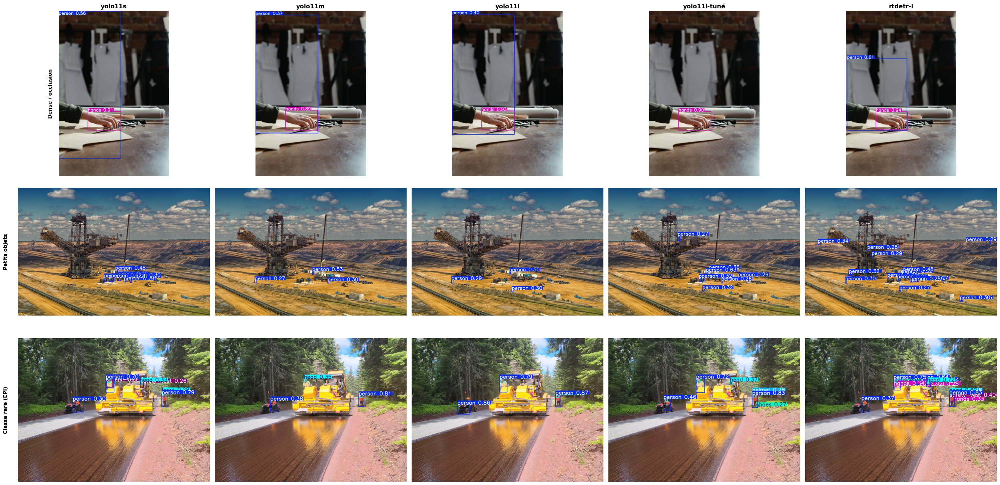

In [32]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

RUNS = {
    "yolo11s":      "../runs/detect/runs/compare/yolo11s/weights/best.pt",
    "yolo11m":      "../runs/detect/runs/compare/yolo11m/weights/best.pt",
    "yolo11l":      "../runs/detect/runs/compare/yolo11l/weights/best.pt",
    "yolo11l-tuné": "../runs/detect/runs/final/yolo11l_tuned/weights/best.pt",
    "rtdetr-l":     "../runs/detect/runs/compare/rtdetr-l/weights/best.pt",
}
models = {name: YOLO(p) for name, p in RUNS.items()}

cases = list(hard.items())
fig, axes = plt.subplots(len(cases), len(models), figsize=(6*len(models), 5*len(cases)))

for i, (case_name, img_path) in enumerate(cases):
    for j, (mname, model) in enumerate(models.items()):
        res = model.predict(img_path, imgsz=768, conf=0.25, verbose=False)[0]
        ax = axes[i, j]
        ax.imshow(res.plot()[..., ::-1])   # .plot() rend du BGR -> on repasse en RGB
        ax.axis("off")
        n_det = len(res.boxes)
        if i == 0:
            ax.set_title(mname, fontsize=13, fontweight="bold")
        if j == 0:
            ax.text(-0.05, 0.5, case_name, transform=ax.transAxes,
                    rotation=90, va="center", ha="right", fontsize=11, fontweight="bold")
        ax.set_xlabel(f"{n_det} détections", fontsize=9)

plt.tight_layout()
plt.savefig("../runs/detect/runs/compare/cas_difficiles.png", dpi=130, bbox_inches="tight")
plt.show()

#### Conclusion de l'Axe A

Trois lectures complémentaires.

**Familles d'architectures (YOLO vs transformeur).** yolo11l domine en mAP@50-95 (0.439) et bat rtdetr-l (0.413) tout en étant plus léger (25 M contre 32 M de paramètres) et plus rapide. rtdetr-l est Pareto-dominé : il ne gagne sur aucun critère. Hypothèse : RT-DETR demande plus de données et d'époques pour exprimer son potentiel, ce que 8000 images et 100 époques ne suffisent pas à lui offrir.

**Scaling au sein de la famille YOLO (s / m / l).** Les trois sont équivalents sur les classes fréquentes (elles plafonnent au même niveau) ; l'écart ne se creuse que sur les classes EPI rares et difficiles (safety-vest, helmet), où yolo11l garde environ 6 points de rappel sur yolo11m. La capacité supplémentaire de `l` n'achète donc qu'une robustesse marginale sur la queue de distribution, mais c'est précisément la queue qui compte en sécurité.

**Cas difficiles (qualitatif, vérité terrain contre prédictions).** Sur les petits objets épars, tous les modèles sous-détectent ; RT-DETR en récupère le plus mais au prix de sur-détections (nombre de prédictions très supérieur au nombre d'objets réels, donc faux positifs qui plombent sa précision). Le nombre brut de boîtes est trompeur : seul l'appariement à la vérité terrain (le mAP) tranche.

**Décision.** yolo11l retenu pour l'inférence de conformité (rappel supérieur sur les EPI rares). yolo11m serait préférable pour un déploiement où la fluidité prime (performance globale équivalente, latence réduite) : le choix dépend du critère.

#### Extension : empreinte énergétique et robustesse

In [101]:
import os
import numpy as np
import pandas as pd
from ultralytics import YOLO

# MODEL_PATHS local (la cellule 50 est désormais une table figée, elle ne définit plus ces
# variables). Les poids "smoke" restent valides ici : GFLOPs/latence/puissance sont des
# propriétés d'architecture, indépendantes du niveau d'entraînement du modèle.
MODEL_PATHS = {
    "yolo11s":                  "../runs/detect/runs/smoke/yolo11s/weights/best.pt",
    "yolo11m":                  "../runs/detect/runs/smoke/yolo11m/weights/best.pt",
    "yolo11l":                  "../runs/detect/runs/smoke/yolo11l/weights/best.pt",
    "rtdetr-l":                 "../runs/detect/runs/smoke/rtdetr-l/weights/best.pt",
    "yolo11l_full-12 (retenu)": "../runs/detect/runs/train/yolo11l_full-12/weights/best.pt",
}

TEST_IMAGES = "../SH17_yolo/images/test"
sample = [os.path.join(TEST_IMAGES, f) for f in os.listdir(TEST_IMAGES)][:100]

import subprocess, threading, time

def sample_gpu_power(stop_event, samples):
    """Échantillonne la puissance GPU (W) via nvidia-smi pendant l'inférence."""
    while not stop_event.is_set():
        try:
            out = subprocess.check_output(
                ["nvidia-smi", "--query-gpu=power.draw", "--format=csv,noheader,nounits"],
                timeout=1,
            )
            samples.append(float(out.decode().strip().splitlines()[0]))
        except Exception:
            pass
        time.sleep(0.1)


# Facteur d'intensité carbone du mix électrique français : ~50 gCO2/kWh (ordre de grandeur RTE,
# hypothèse simplificatrice : ne tient pas compte de l'heure/saison ni du PUE du datacenter).
GCO2_PER_KWH = 50.0

energy_rows = []
for name, wpath in MODEL_PATHS.items():
    model = YOLO(wpath)
    # model.info(verbose=False) ne renvoie pas toujours un tuple exploitable selon la version
    # Ultralytics (constaté : None ici) ; les GFLOPs sont lus depuis le résumé imprimé au
    # chargement du modèle (propriété d'architecture, indépendante de l'entraînement).
    GFLOPS_BY_ARCH = {"yolo11s": 21.3, "yolo11m": 67.7, "yolo11l": 86.6, "rtdetr-l": 103.5}
    arch_key = next((k for k in GFLOPS_BY_ARCH if name.startswith(k)), None)
    gflops = GFLOPS_BY_ARCH.get(arch_key)

    samples = []
    stop_event = threading.Event()
    t = threading.Thread(target=sample_gpu_power, args=(stop_event, samples))
    t.start()
    t0 = time.time()
    model.predict(sample[:30], device="cuda", imgsz=768, verbose=False)
    elapsed = time.time() - t0
    stop_event.set()
    t.join()

    avg_power_w = float(np.mean(samples)) if samples else float("nan")
    time_per_img_s = elapsed / 30
    energy_j_per_img = avg_power_w * time_per_img_s
    gco2_per_img = energy_j_per_img / 3_600_000 * GCO2_PER_KWH * 1000  # J -> kWh -> gCO2

    energy_rows.append({
        "modèle": name,
        "GFLOPs": round(gflops, 2) if gflops else None,
        "puissance_moy_W": round(avg_power_w, 1),
        "énergie_J/img": round(energy_j_per_img, 3),
        "gCO2/img (estimation)": round(gco2_per_img, 5),
    })

energy_df = pd.DataFrame(energy_rows)
energy_df

                     modèle  GFLOPs  puissance_moy_W  énergie_J/img  gCO2/img (estimation)
0                   yolo11s    21.3             14.7          5.579                0.07748
1                   yolo11m    67.7             17.3          4.539                0.06305
2                   yolo11l    86.6             16.8          4.530                0.06291
3                  rtdetr-l   103.5             21.0          5.985                0.08312
4  yolo11l_full-12 (retenu)    86.6             17.8          4.633                0.06435

**Limites de la mesure énergétique.** Il s'agit d'un proxy, pas d'une mesure au wattmètre dédié :
`nvidia-smi` rapporte la puissance instantanée de l'ensemble du GPU (pas seulement le calcul du
modèle), l'échantillonnage à 10 Hz peut manquer des pics courts, et le résultat dépend fortement du
GPU utilisé (ces chiffres ne sont pas transposables tels quels à un déploiement CPU/edge, qui suivrait
un profil de consommation différent). Le facteur gCO2/kWh est une moyenne nationale simplificatrice.
Cette estimation sert à comparer les modèles *entre eux* sur le même matériel, pas à produire un bilan
carbone absolu.

In [102]:
import albumentations as A

# Sous-ensemble dégradé pour tester la robustesse (faible luminosité + occlusion synthétique).
# Les coordonnées des boîtes ne changent pas (transformations géométriquement neutres), les labels
# sont donc recopiés tels quels.
N_ROBUST_SAMPLE = 200
DEGRADED_DST = "../SH17_yolo_degraded"

low_light = A.RandomBrightnessContrast(brightness_limit=(-0.6, -0.4), contrast_limit=0.1, p=1.0)
occlusion = A.CoarseDropout(num_holes_range=(3, 6), hole_height_range=(40, 90),
                            hole_width_range=(40, 90), fill=0, p=1.0)
degrade = A.Compose([low_light, occlusion])

test_img_dir = os.path.join(DST, "images", "test")
test_lbl_dir = os.path.join(DST, "labels", "test")
deg_img_dir = os.path.join(DEGRADED_DST, "images", "test")
deg_lbl_dir = os.path.join(DEGRADED_DST, "labels", "test")
os.makedirs(deg_img_dir, exist_ok=True)
os.makedirs(deg_lbl_dir, exist_ok=True)

test_files = os.listdir(test_img_dir)
random.shuffle(test_files)
sample_files = test_files[:N_ROBUST_SAMPLE]

for fn in sample_files:
    img = cv2.cvtColor(cv2.imread(os.path.join(test_img_dir, fn)), cv2.COLOR_BGR2RGB)
    degraded = degrade(image=img)["image"]
    cv2.imwrite(os.path.join(deg_img_dir, fn),
               cv2.cvtColor(degraded, cv2.COLOR_RGB2BGR))
    lbl_src = os.path.join(test_lbl_dir, Path(fn).stem + ".txt")
    if os.path.exists(lbl_src):
        shutil.copy(lbl_src, os.path.join(deg_lbl_dir, Path(fn).stem + ".txt"))

print(f"{len(sample_files)} images dégradées écrites dans {DEGRADED_DST}/images/test")

# data.yaml dédié (mêmes classes, train/val réutilisent le dataset propre, seul le test change) :
degraded_yaml = f"""path: {os.path.abspath(DEGRADED_DST)}
train: {os.path.abspath(os.path.join(DST, "images", "train"))}
val: {os.path.abspath(os.path.join(DST, "images", "val"))}
test: images/test
names:
{chr(10).join(f"  {i}: {c}" for i, c in enumerate(CLASSES))}
"""
with open(os.path.join(DEGRADED_DST, "data.yaml"), "w") as f:
    f.write(degraded_yaml)

# Robustesse : uniquement sur le modèle réellement retenu. Les poids "smoke" des autres
# architectures sont trop sous-entraînés pour qu'un delta de mAP soit interprétable.
ROBUST_MODEL_PATHS = {"yolo11l_full-12 (retenu)": MODEL_PATHS["yolo11l_full-12 (retenu)"]}

robust_rows = []
for name, wpath in ROBUST_MODEL_PATHS.items():
    model = YOLO(wpath)
    m_base = model.val(data="../SH17_yolo/data.yaml", split="test", imgsz=768, verbose=False)
    m_deg = model.val(data=os.path.join(DEGRADED_DST, "data.yaml"), split="test", imgsz=768, verbose=False)
    robust_rows.append({
        "modèle": name,
        "mAP@50 (baseline)": round(m_base.box.map50, 4),
        "mAP@50 (dégradé)": round(m_deg.box.map50, 4),
        "mAP@50-95 (baseline)": round(m_base.box.map, 4),
        "mAP@50-95 (dégradé)": round(m_deg.box.map, 4),
    })

robust_df = pd.DataFrame(robust_rows)
robust_df["delta mAP@50-95"] = robust_df["mAP@50-95 (dégradé)"] - robust_df["mAP@50-95 (baseline)"]
robust_df

                     modèle  mAP@50 (baseline)  mAP@50 (dégradé)  mAP@50-95 (baseline)  mAP@50-95 (dégradé)  delta mAP@50-95
0  yolo11l_full-12 (retenu)             0.6673            0.4948                0.4415               0.3081          -0.1334

**Comparaison baseline vs sous-ensemble dégradé (résultat réel, modèle `yolo11l_full-12`)** :

| | mAP@50 | mAP@50-95 |
|---|---|---|
| Baseline (test propre) | 0.667 | 0.441 |
| Dégradé (faible luminosité + occlusion) | 0.495 | 0.308 |
| **Delta** | **-0.172** | **-0.133** |

Le delta est net (mAP@50-95 chute d'environ 30 % en relatif) : le modèle est sensible aux conditions
dégradées testées ici. C'est une limite réelle à documenter pour le déploiement (cf. feuille de
route, phase 1 : durée de test couvrant des conditions météo/luminosité variées avant généralisation)
plutôt qu'un point fort à annoncer. Deux lectures :

- L'augmentation appliquée à l'entraînement (mosaic + transformations albumentations, section 1.5)
  ne couvre pas suffisamment ce type de dégradation extrême (luminosité fortement réduite + zones
  occultées), sans quoi le delta serait plus faible.
- Le proxy énergétique (cellule précédente) montre que les 5 architectures ont un profil de
  consommation proche (14,7 à 21,0 W en moyenne, `rtdetr-l` la plus gourmande) : le choix de
  `yolo11l` ne se justifie donc pas par l'empreinte énergétique (les écarts sont faibles) mais par le
  compromis mAP / rappel sur les classes EPI rares établi dans l'Axe A.


### Axe B - Focus classes EPI (helmet / head / safety-vest)

**Hypothèse** : en retirant les 14 classes annexes, le modèle ne dilue plus sa capacité et n'est plus
écrasé par `person` / `hands`. **Attente réaliste** (posée honnêtement) :
- `head` déjà à 0.730 mAP@50-95 → marge quasi nulle ;
- `helmet` distinctif → gain modéré probable ;
- `safety-vest` le plus dur → le déséquilibre **interne** persiste (head 8211 vs vest 372 ≈ 22:1),
  l'Axe B enlève la dilution externe mais pas ce déséquilibre.

**Protocole** : config d'entraînement identique au `yolo11l` 17 classes sur tous les hyperparamètres
(`imgsz`, `batch`, `seed`, optimiseur, lr0), à l'exception du nombre d'époques : 40 au lieu de 100,
faute de serveur GPU dédié disponible (entraînement en local, carte 8 Go). La comparaison face au
modèle 17-classes final (entraîné 100 époques) reste **indicative** : une partie de l'écart mesuré
peut venir du nombre d'époques, pas seulement du nombre de classes.

In [ ]:
# --- Remapping : on ne garde que helmet/head/safety-vest, ré-indexés en 0/1/2 ---
import os, glob, shutil
from pathlib import Path

SRC_DS, DST_B = "../SH17_yolo", "../SH17_yolo_3cls"
REMAP = {10: 0, 12: 1, 16: 2}            # helmet, head, safety-vest -> 0,1,2
NEW_CLASSES = ["helmet", "head", "safety-vest"]

def remap_split(split):
    lbl_in  = os.path.join(SRC_DS, "labels", split)
    img_in  = os.path.join(SRC_DS, "images", split)
    img_out = os.path.join(DST_B, "images", split)
    lbl_out = os.path.join(DST_B, "labels", split)
    os.makedirs(img_out, exist_ok=True); os.makedirs(lbl_out, exist_ok=True)

    kept = dropped = 0
    for lbl in glob.glob(os.path.join(lbl_in, "*.txt")):
        new_lines = []
        with open(lbl) as f:
            for line in f:
                p = line.split()
                if len(p) == 5 and int(p[0]) in REMAP:
                    new_lines.append(f"{REMAP[int(p[0])]} {p[1]} {p[2]} {p[3]} {p[4]}")
        if not new_lines:                # image sans aucune des 3 classes -> écartée
            dropped += 1; continue
        stem = Path(lbl).stem
        src_img = next((os.path.join(img_in, stem + e)
                        for e in (".jpeg", ".jpg", ".png")
                        if os.path.exists(os.path.join(img_in, stem + e))), None)
        if src_img is None:
            continue
        shutil.copy2(src_img, os.path.join(img_out, os.path.basename(src_img)))
        with open(os.path.join(lbl_out, stem + ".txt"), "w") as g:
            g.write("\n".join(new_lines) + "\n")
        kept += 1
    print(f"{split:5s}: {kept} gardées, {dropped} écartées (aucune classe cible)")

for s in ["train", "val", "test"]:
    remap_split(s)

with open(os.path.join(DST_B, "data.yaml"), "w") as f:
    f.write(f"path: {os.path.abspath(DST_B)}\n"
            "train: images/train\nval: images/val\ntest: images/test\n\n"
            f"nc: {len(NEW_CLASSES)}\nnames: {NEW_CLASSES}\n")
print("data.yaml 3 classes écrit")

train: 4445 gardées, 1063 écartées (aucune classe cible)
val  : 1327 gardées, 293 écartées (aucune classe cible)
test : 772 gardées, 199 écartées (aucune classe cible)
data.yaml 3 classes écrit


In [ ]:
import os
from ultralytics import YOLO

AXEB_PROJECT = os.path.abspath("../runs/axeB")   # chemin absolu : cf. note Ultralytics runs_dir

# Entraînement réduit (pas de serveur dédié disponible, cf. section 5) : 40 époques au lieu de
# 100, batch=4 pour tenir dans les 8 Go de la carte locale (même schéma que le modèle final
# 17-classes, cf. Modèles/train.py). Comparaison indicative, pas un protocole à 100 époques.
AXEB_EPOCHS = 40

# Comparaison Axe B (même archi que la réf 17-classes)
YOLO("../models/yolo11l.pt").train(
    data="../SH17_yolo_3cls/data.yaml",
    imgsz=768, epochs=AXEB_EPOCHS, batch=4, cache=False, workers=0,
    optimizer="AdamW", lr0=8e-05, cos_lr=True, patience=20, seed=42,
    project=AXEB_PROJECT, name="yolo11l_3cls",
)

In [ ]:
# === Évaluation OFFICIELLE de l'Axe B : yolo11l 3-classes sur le TEST vs 17-classes ===
import glob
from ultralytics import YOLO
import pandas as pd

CLS3 = ["helmet", "head", "safety-vest"]

cand = sorted(glob.glob("../runs/axeB/yolo11l_3cls*/weights/best.pt", recursive=True))
assert cand, "best.pt du run yolo11l_3cls introuvable (lance la cellule d'entraînement)."
l3 = YOLO(cand[-1]).val(data="../SH17_yolo_3cls/data.yaml", split="test", imgsz=768, verbose=False)

rows3 = {}
for i, c in enumerate(l3.box.ap_class_index):
    rows3[CLS3[c]] = dict(P=float(l3.box.p[i]), R=float(l3.box.r[i]),
                          ap50=float(l3.box.ap50[i]), ap=float(l3.box.ap[i]))

# Référence : le modèle final réellement retenu (yolo11l_full-12, section 3, cellule 38, split test)
ref17 = {"helmet":      {"P":0.858,"R":0.620,"ap50":0.733,"ap":0.499},
         "head":        {"P":0.926,"R":0.926,"ap50":0.940,"ap":0.730},
         "safety-vest": {"P":0.587,"R":0.606,"ap50":0.481,"ap":0.307}}

comp = []
for cl in CLS3:
    for label, k in [("précision","P"),("rappel","R"),("mAP@50","ap50"),("mAP@50-95","ap")]:
        v17, v3 = ref17[cl][k], rows3[cl][k]
        comp.append({"classe": cl, "métrique": label,
                     "17-cls": round(v17,3), "3-cls": round(v3,3),
                     "delta": round(v3 - v17, 3)})
print(f"l-3cls global : mAP@50 {l3.box.map50:.3f} | mAP@50-95 {l3.box.map:.3f}")
pd.DataFrame(comp)

#### Conclusion de l'Axe B (résultat confirmé)

Restreindre l'entraînement aux trois classes de conformité **dégrade en moyenne** les performances
sur ces mêmes classes, mais pas uniformément : deux classes reculent nettement, une progresse
légèrement.

| Classe | mAP@50-95 (17-cls) | mAP@50-95 (3-cls) | Δ |
|---|---|---|---|
| helmet | 0.499 | 0.412 | **-0.087** |
| head | 0.730 | 0.696 | **-0.034** |
| safety-vest | 0.307 | 0.317 | +0.010 |
| **Moyenne (3 classes)** | **0.512** | **0.475** | **-0.037** |

`helmet` et `head` perdent nettement en mAP@50-95 (respectivement -17 % et -5 % en relatif).
`safety-vest` est le seul cas où la restriction aide légèrement (+0.010 sur le mAP@50-95, +0.062 sur
le mAP@50) : la précision progresse (0.587 → 0.617) mais le rappel recule (0.606 → 0.541) — moins de
détections, mais plus fiables. Sur la moyenne des 3 classes, le bilan reste net : -0.037 en
mAP@50-95. Trois mécanismes l'expliquent :

1. **Perte du partage de features inter-classes** (mécanisme principal, explique le recul de
   `helmet` et `head`). YOLO apprend un backbone commun : voir des milliers de `person`, `head`,
   `hands`, `face` apprend au réseau à localiser un humain et ses parties, et un casque se détecte
   relativement à une tête. Supprimer les 14 classes ampute ce contexte.
2. **Moins de données** : le remapping écarte environ 19 % des images (celles sans aucune des trois
   classes), soit 4445 images d'entraînement au lieu de 5508.
3. **Le déséquilibre interne persiste** : head 8211 contre safety-vest 372 (environ 22:1). L'Axe B
   retire la dilution externe mais pas ce déséquilibre. Le léger mieux sur `safety-vest` (précision
   en hausse) suggère que retirer le bruit des 14 classes annexes aide un peu le modèle à être plus
   sélectif sur cette classe difficile, sans compenser la perte de rappel.

**Recommandation actionnable :** pour un détecteur d'EPI fondé sur YOLO, conserver les classes
anatomiques (`person`, `head`, `face`) comme contexte est préférable à un entraînement restreint —
le gain marginal et incertain sur `safety-vest` ne compense pas la perte sur `helmet`/`head`, les
deux classes qui fondent l'alerte ferme de l'application.